***AI Engineer - P8 - Traiter les images pour le système embarqué d'une voiture autonome***

# Importation des modules

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout
from tensorflow.keras.optimizers import Adadelta, Nadam
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model, Sequence, to_categorical
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing import image
import tensorflow as tf

from collections import Counter

import cv2

import albumentations as A

C:\Users\steph\AppData\Roaming\Python\Python311\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
# Crée le dossier de logs s'il n'existe pas
log_dir = 'C:\\Users\\steph\\Desktop\\Openclassrooms\\tmp'
os.makedirs(log_dir, exist_ok=True)

# Fonctions

## Fonctions d'analyse des images

In [3]:
def find_images_with_text(directory, text):
    """
    Parcourt récursivement un répertoire pour trouver des fichiers contenant un texte spécifique dans leur nom.

    Paramètres:
    directory: Le répertoire racine à parcourir.
    text: Le texte à rechercher dans les noms de fichiers.
    
    Retourne: 
    Une liste des chemins des fichiers dont le nom contient le texte spécifié.
    """
    image_list = []

    # Utilisation de os.walk pour parcourir tous les sous-dossiers et fichiers
    for root, dirs, files in os.walk(directory):
        for file in files:
            # Vérification si le texte spécifié est dans le nom du fichier
            if text in file:
                # Ajout du chemin complet du fichier à la liste
                image_list.append(os.path.join(root, file))

    return image_list

In [4]:
def show_random_images_with_masks(df, n=1):
    """
    Affiche aléatoirement n images et leurs masques associés à partir d'un DataFrame.

    Paramètres:
    df: DataFrame contenant les colonnes 'image' et 'mask', avec les chemins des images.
    n: Nombre d'images à afficher (par défaut 1).
    """
    # Sélectionne n lignes aléatoires dans le DataFrame
    indices = random.sample(range(len(df)), n)
    selected_rows = df.iloc[indices]
    
    # Parcours des lignes sélectionnées pour afficher les images et les masques
    for _, row in selected_rows.iterrows():
        image_path = row['image']
        mask_path = row['mask']
        color_path = row['color']
        
        # Lecture de l'image et du masque
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Charger le masque en niveaux de gris
        color = cv2.imread(color_path)
        
        # Affichage de l'image et du masque côte à côte
        plt.figure(figsize=(10, 5))
        
        # Affiche l'image
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Image")
        plt.axis("off")
        
        # Affiche le masque
        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Masque en gris")
        plt.axis("off")
        
        # Affiche le masque en couleurs
        plt.subplot(1, 3, 3)
        plt.imshow(color)
        plt.title("Masque en couleurs")
        plt.axis("off")
        
        # Affiche le graphique
        plt.show()

## Fonctions des métriques

In [5]:
def dice_coeff(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))  # Conversion explicite en float32
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))  # Conversion explicite en float32
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)

def total_loss(y_true, y_pred):
    binary_crossentropy_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice_loss_value = dice_loss(y_true, y_pred)
    return 0.5 * binary_crossentropy_loss + 0.5 * dice_loss_value  # Pondération équilibrée

def jaccard_score(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

# Fonction pour calculer l'IoU (Jaccard) pour chaque classe
#def calculate_iou(true_mask, pred_mask, num_classes):
#    ious = []
#    for cls in range(num_classes):
#        true_cls = (true_mask == cls).astype(int)
#        pred_cls = (pred_mask == cls).astype(int)
#        iou = jaccard_score(true_cls.flatten(), pred_cls.flatten())
#        ious.append(iou)
#    return ious

## Fonctions de visualisation

In [6]:
# Fonction de visualisation avec IoU pour chaque classe
def plot_sample_prediction(epoch, logs, idx, model):
    img = np.expand_dims(images[idx], axis=0)
    pred_mask = model.predict(img)[0]
    pred_mask = np.argmax(pred_mask, axis=-1)
    true_mask = np.argmax(masks[idx], axis=-1)
    
    # Calcul des IoU
    num_classes = len(cats)
    #iou_pred = calculate_iou(true_mask, pred_mask, num_classes)

    # Ajustement de la taille et de la disposition de la figure
    fig, ax = plt.subplots(1, 3, figsize=(15, 5)) 
    fig.suptitle(f"Époque {epoch + 1}", fontsize=16)

    # Image d'origine
    ax[0].imshow(images[idx])
    ax[0].set_title("Image")
    ax[0].axis('off')
    
    # Masque réel
    ax[1].imshow(true_mask, cmap='tab10')
    ax[1].set_title("Masque réel")
    ax[1].axis('off')
    
    # Masque prédit
    ax[2].imshow(pred_mask, cmap='tab10')
    ax[2].set_title("Masque prédit")
    ax[2].axis('off')
    
    plt.subplots_adjust(wspace=0.4)  # Réduit l'espacement horizontal entre les graphiques
    plt.show()


## Autres fonctions

In [7]:
# Chargement et préparation des données avec les dimensions correctes
def load_and_preprocess_image(path, target_size=(512, 1024)):
    image = cv2.imread(path)
    image = cv2.resize(image, (target_size[1], target_size[0]))  # Mettre en forme (512, 256) pour (largeur, hauteur)
    image = image / 255.0  # Normalisation
    return image

def load_images(df, target_size=(512, 1024)):
    images = np.array([load_and_preprocess_image(img_path, target_size) for img_path in df['image']])
    return images

In [8]:
# Préparation des masques de segmentation
#def load_mask(path, target_size=(512, 1024)):
#    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
#    mask = cv2.resize(mask, (target_size[1], target_size[0]), interpolation=cv2.INTER_NEAREST)
#    mask = np.vectorize(cat_map.get)(mask)  # Remap categories
#    return mask

# Préparation des masques de segmentation
def load_mask(path, target_size=(512, 1024)):  # Taille ajustée
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (target_size[1], target_size[0]), interpolation=cv2.INTER_NEAREST)
    
    # Assurez-vous que toutes les valeurs du masque sont valides
    unique_values = np.unique(mask)
    for value in unique_values:
        if value not in cat_map:
            print(f"Valeur inconnue dans le masque : {value}")
    
    mask = np.vectorize(cat_map.get)(mask)  # Remap categories
    return mask

def load_masks(df, target_size=(512, 1024)):
    masks = np.array([load_mask(mask_path, target_size) for mask_path in df['mask']])
    masks = to_categorical(masks, num_classes=len(cats))  # One-hot encoding
    return masks

In [9]:
# Callback pour afficher la prédiction et les graphiques IoU après chaque époque
class PredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self, custom_model):
        super().__init__()
        self.custom_model = custom_model
        # Générer un index aléatoire une seule fois pour toutes les époques
        self.idx = np.random.randint(len(images))
    
    def on_epoch_end(self, epoch, logs=None):
        plot_sample_prediction(epoch, logs, self.idx, self.custom_model)

In [10]:
def weighted_categorical_crossentropy(weights):
    """
    Fonction de perte pondérée pour tenir compte des classes déséquilibrées.
    """
    def loss(y_true, y_pred):
        y_true_one_hot = tf.cast(y_true, 'float32')  # Conversion explicite en float32
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)  # Éviter les valeurs extrêmes
        
        # Calculer les poids pour chaque classe
        weights_per_class = tf.reduce_sum(weights * y_true_one_hot, axis=-1)
        unweighted_loss = -tf.reduce_sum(y_true_one_hot * tf.math.log(y_pred), axis=-1)
        
        return weights_per_class * unweighted_loss
    return loss

In [11]:
def unet(input_size=(512, 1024, 3), num_classes=8):
    inputs = Input(input_size)
    
    # Encoder (partie contractante)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottleneck
    conv5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Decoder (partie expansive)
    up6 = UpSampling2D(size=(2, 2))(drop5)
    up6 = concatenate([up6, drop4], axis=-1)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = concatenate([up7, conv3], axis=-1)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)

    up8 = UpSampling2D(size=(2, 2))(conv7)
    up8 = concatenate([up8, conv2], axis=-1)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)

    up9 = UpSampling2D(size=(2, 2))(conv8)
    up9 = concatenate([up9, conv1], axis=-1)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(conv9)
    
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Chargement des images

In [12]:
image_train_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\train\\"
mask_train_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\train\\"

image_val_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\val\\"
mask_val_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\val\\"

image_test_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\test\\"
mask_test_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\test\\"

In [13]:
search_image_text = "leftImg8bit"

image_train_list = find_images_with_text(image_train_dir, search_image_text)
image_val_list = find_images_with_text(image_val_dir, search_image_text)
image_test_list = find_images_with_text(image_test_dir, search_image_text)

print('Nombre d\'images d\'entraînement :',len(image_train_list))
print('Nombre d\'images de validation :',len(image_val_list))
print('Nombre d\'images de test :',len(image_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [14]:
search_mask_text = "labelIds"

mask_train_list = find_images_with_text(mask_train_dir, search_mask_text)
mask_val_list = find_images_with_text(mask_val_dir, search_mask_text)
mask_test_list = find_images_with_text(mask_test_dir, search_mask_text)

print('Nombre de mask d\'entraînement :',len(mask_train_list))
print('Nombre de mask de validation :',len(mask_val_list))
print('Nombre de mask de test :',len(mask_test_list))

Nombre de mask d'entraînement : 2975
Nombre de mask de validation : 500
Nombre de mask de test : 1525


In [15]:
search_color_text = "color"

color_train_list = find_images_with_text(mask_train_dir, search_color_text)
color_val_list = find_images_with_text(mask_val_dir, search_color_text)
color_test_list = find_images_with_text(mask_test_dir, search_color_text)

print('Nombre d\'images d\'entraînement :',len(color_train_list))
print('Nombre d\'images de validation :',len(color_val_list))
print('Nombre d\'images de test :',len(color_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [16]:
image_train_list.sort()
mask_train_list.sort()
color_train_list.sort()

image_val_list.sort()
mask_val_list.sort()
color_val_list.sort()

image_test_list.sort()
mask_test_list.sort()
color_test_list.sort()

In [17]:
df_train = pd.DataFrame({
    'image': image_train_list,
    'mask': mask_train_list,
    'color': color_train_list
})

In [18]:
df_val = pd.DataFrame({
    'image': image_val_list,
    'mask': mask_val_list,
    'color': color_val_list
})

In [19]:
df_test = pd.DataFrame({
    'image': image_test_list,
    'mask': mask_test_list,
    'color': color_test_list
})

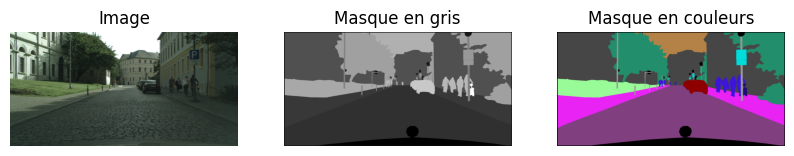

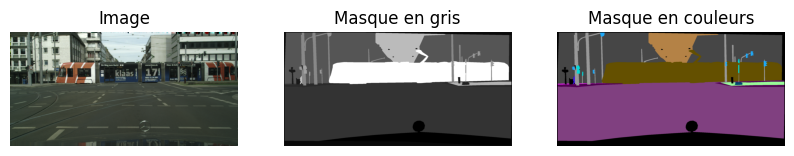

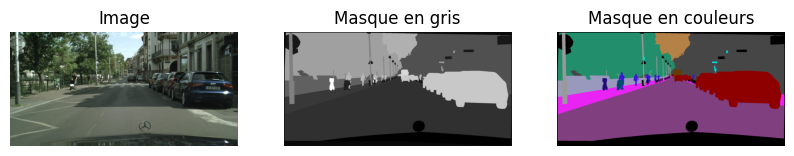

In [20]:
show_random_images_with_masks(df_train, n=3)

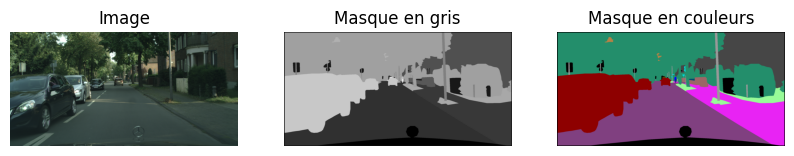

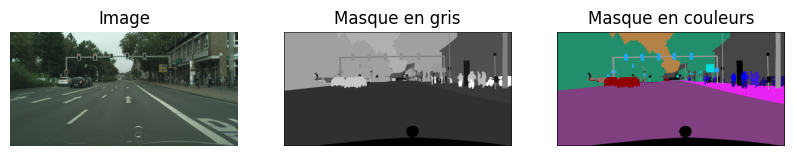

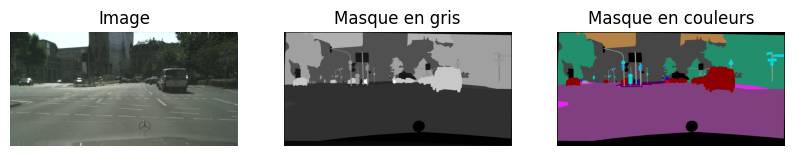

In [21]:
show_random_images_with_masks(df_val, n=3)

In [22]:
image0 = cv2.imread(df_train.iloc[0,0])
mask0 = cv2.imread(df_train.iloc[0,1])

print('Dimension image :', image0.shape)
print('Dimension mask :', mask0.shape)

Dimension image : (1024, 2048, 3)
Dimension mask : (1024, 2048, 3)


In [23]:
df_train_sample = df_train.sample(n=100, random_state=42)

# Catégories

In [24]:
cats = {
    'void': [0, 1, 2, 3, 4, 5, 6],
    'flat': [7, 8, 9, 10],
    'construction': [11, 12, 13, 14, 15, 16],
    'object': [17, 18, 19, 20],
    'nature': [21, 22],
    'sky': [23],
    'human': [24, 25],
    'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
}

In [25]:
# Création d'une carte de catégories pour les masques
cat_map = {}
for i, (cat, ids) in enumerate(cats.items()):
    for id_ in ids:
        cat_map[id_] = i

# Sans data augmentation

## Entrainement avec VGG16

In [33]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [34]:
filename = f"best_model_vgg16.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [35]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [ ]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

In [37]:
# Construction du modèle de segmentation
vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(512, 1024, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in vgg16_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
x = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
vgg16_segmentation_model = Model(inputs=vgg16_model.input, outputs=x)

# Compilation du modèle
#model20.compile(optimizer='adam', loss=loss_with_weights, metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy'])
vgg16_segmentation_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 45s/step - accuracy: 0.2489 - dice_coeff: 0.1670 - dice_loss: 0.8330 - jaccard_score: 0.0930 - loss: 0.0888 - total_loss: 0.7708 
Epoch 1: val_jaccard_score improved from -inf to 0.24317, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 704s 704s/step


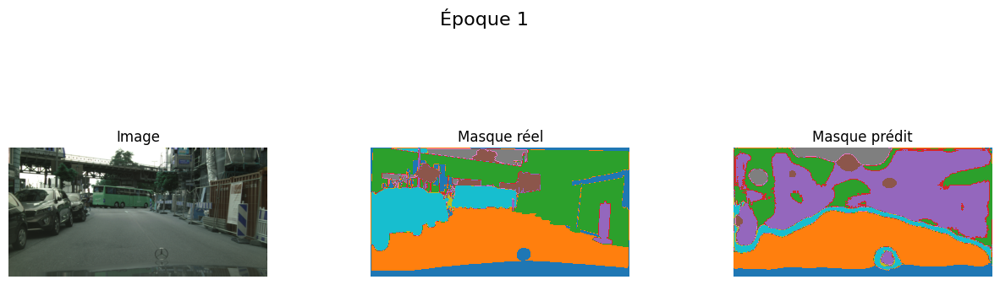

20/20 ━━━━━━━━━━━━━━━━━━━━ 1662s 85s/step - accuracy: 0.2567 - dice_coeff: 0.1711 - dice_loss: 0.8289 - jaccard_score: 0.0957 - loss: 0.0884 - total_loss: 0.7684 - val_accuracy: 0.5423 - val_dice_coeff: 0.3905 - val_dice_loss: 0.6095 - val_jaccard_score: 0.2432 - val_loss: 0.0559 - val_total_loss: 0.6395
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46s/step - accuracy: 0.5914 - dice_coeff: 0.4466 - dice_loss: 0.5534 - jaccard_score: 0.2901 - loss: 0.0587 - total_loss: 0.6023 
Epoch 2: val_jaccard_score improved from 0.24317 to 0.29097, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 675s 675s/step


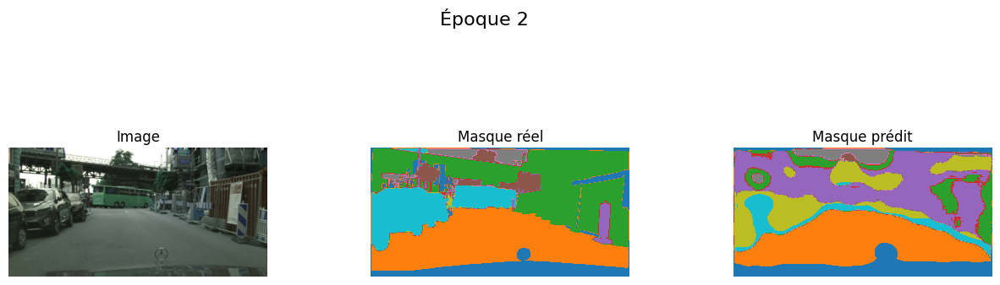

20/20 ━━━━━━━━━━━━━━━━━━━━ 1640s 83s/step - accuracy: 0.5903 - dice_coeff: 0.4465 - dice_loss: 0.5535 - jaccard_score: 0.2900 - loss: 0.0588 - total_loss: 0.6019 - val_accuracy: 0.5388 - val_dice_coeff: 0.4503 - val_dice_loss: 0.5497 - val_jaccard_score: 0.2910 - val_loss: 0.0520 - val_total_loss: 0.5910
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.6858 - dice_coeff: 0.5235 - dice_loss: 0.4765 - jaccard_score: 0.3581 - loss: 0.0476 - total_loss: 0.5468 
Epoch 3: val_jaccard_score improved from 0.29097 to 0.46355, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 600s 600s/step


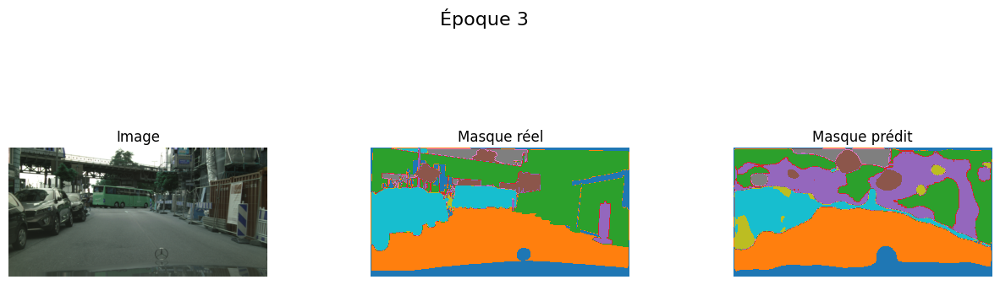

20/20 ━━━━━━━━━━━━━━━━━━━━ 1492s 76s/step - accuracy: 0.6867 - dice_coeff: 0.5255 - dice_loss: 0.4745 - jaccard_score: 0.3600 - loss: 0.0475 - total_loss: 0.5461 - val_accuracy: 0.7265 - val_dice_coeff: 0.6330 - val_dice_loss: 0.3670 - val_jaccard_score: 0.4635 - val_loss: 0.0376 - val_total_loss: 0.4904
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.7502 - dice_coeff: 0.6435 - dice_loss: 0.3565 - jaccard_score: 0.4782 - loss: 0.0373 - total_loss: 0.4629 
Epoch 4: val_jaccard_score did not improve from 0.46355
1/1 ━━━━━━━━━━━━━━━━━━━━ 625s 625s/step


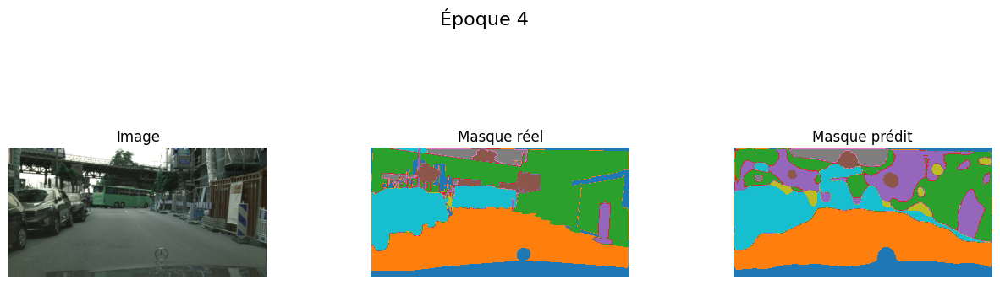

20/20 ━━━━━━━━━━━━━━━━━━━━ 1481s 76s/step - accuracy: 0.7498 - dice_coeff: 0.6431 - dice_loss: 0.3569 - jaccard_score: 0.4778 - loss: 0.0373 - total_loss: 0.4631 - val_accuracy: 0.7563 - val_dice_coeff: 0.6317 - val_dice_loss: 0.3683 - val_jaccard_score: 0.4618 - val_loss: 0.0335 - val_total_loss: 0.4607
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.7752 - dice_coeff: 0.6627 - dice_loss: 0.3373 - jaccard_score: 0.4973 - loss: 0.0361 - total_loss: 0.4488 
Epoch 5: val_jaccard_score did not improve from 0.46355
1/1 ━━━━━━━━━━━━━━━━━━━━ 606s 606s/step


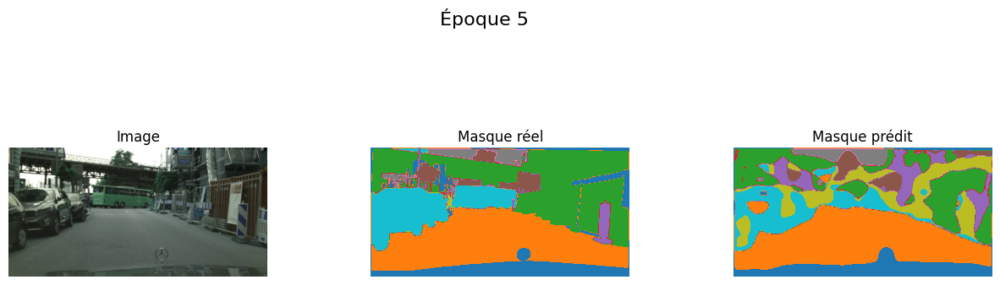

20/20 ━━━━━━━━━━━━━━━━━━━━ 1433s 73s/step - accuracy: 0.7739 - dice_coeff: 0.6618 - dice_loss: 0.3382 - jaccard_score: 0.4963 - loss: 0.0363 - total_loss: 0.4496 - val_accuracy: 0.7312 - val_dice_coeff: 0.5901 - val_dice_loss: 0.4099 - val_jaccard_score: 0.4187 - val_loss: 0.0398 - val_total_loss: 0.5038
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.7221 - dice_coeff: 0.5870 - dice_loss: 0.4130 - jaccard_score: 0.4191 - loss: 0.0393 - total_loss: 0.5210 
Epoch 6: val_jaccard_score improved from 0.46355 to 0.48856, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 603s 603s/step


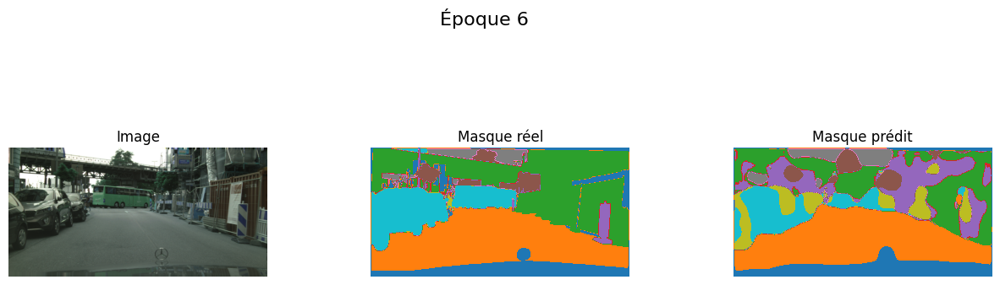

20/20 ━━━━━━━━━━━━━━━━━━━━ 1480s 76s/step - accuracy: 0.7228 - dice_coeff: 0.5890 - dice_loss: 0.4110 - jaccard_score: 0.4211 - loss: 0.0392 - total_loss: 0.5201 - val_accuracy: 0.7316 - val_dice_coeff: 0.6561 - val_dice_loss: 0.3439 - val_jaccard_score: 0.4886 - val_loss: 0.0328 - val_total_loss: 0.4873
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.7788 - dice_coeff: 0.6799 - dice_loss: 0.3201 - jaccard_score: 0.5162 - loss: 0.0319 - total_loss: 0.4484 
Epoch 7: val_jaccard_score improved from 0.48856 to 0.57930, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 642s 642s/step


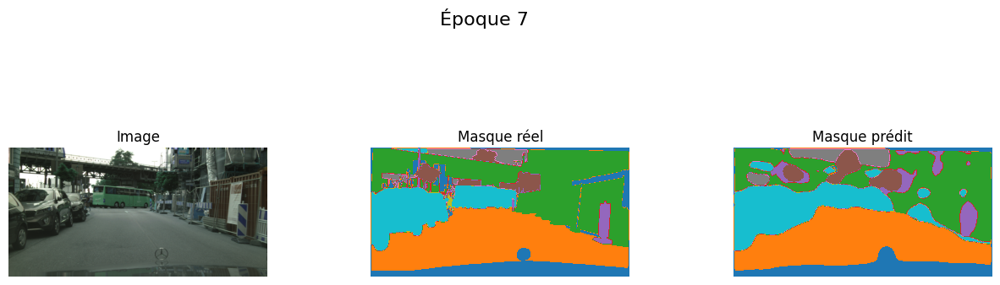

20/20 ━━━━━━━━━━━━━━━━━━━━ 1483s 76s/step - accuracy: 0.7792 - dice_coeff: 0.6806 - dice_loss: 0.3194 - jaccard_score: 0.5171 - loss: 0.0318 - total_loss: 0.4478 - val_accuracy: 0.8023 - val_dice_coeff: 0.7332 - val_dice_loss: 0.2668 - val_jaccard_score: 0.5793 - val_loss: 0.0301 - val_total_loss: 0.4083
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.8220 - dice_coeff: 0.7452 - dice_loss: 0.2548 - jaccard_score: 0.5952 - loss: 0.0266 - total_loss: 0.3844 
Epoch 8: val_jaccard_score did not improve from 0.57930
1/1 ━━━━━━━━━━━━━━━━━━━━ 609s 609s/step


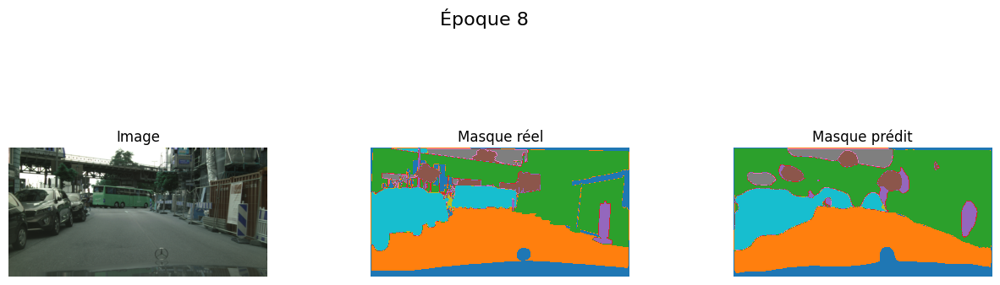

20/20 ━━━━━━━━━━━━━━━━━━━━ 1443s 74s/step - accuracy: 0.8211 - dice_coeff: 0.7445 - dice_loss: 0.2555 - jaccard_score: 0.5944 - loss: 0.0266 - total_loss: 0.3848 - val_accuracy: 0.8242 - val_dice_coeff: 0.7217 - val_dice_loss: 0.2783 - val_jaccard_score: 0.5652 - val_loss: 0.0301 - val_total_loss: 0.4063
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.8395 - dice_coeff: 0.7546 - dice_loss: 0.2454 - jaccard_score: 0.6067 - loss: 0.0267 - total_loss: 0.3750 
Epoch 9: val_jaccard_score improved from 0.57930 to 0.60290, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 615s 615s/step


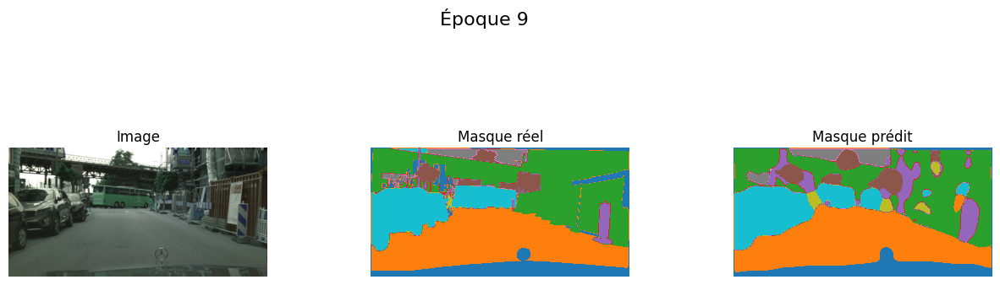

20/20 ━━━━━━━━━━━━━━━━━━━━ 1493s 77s/step - accuracy: 0.8390 - dice_coeff: 0.7547 - dice_loss: 0.2453 - jaccard_score: 0.6068 - loss: 0.0266 - total_loss: 0.3752 - val_accuracy: 0.8253 - val_dice_coeff: 0.7517 - val_dice_loss: 0.2483 - val_jaccard_score: 0.6029 - val_loss: 0.0251 - val_total_loss: 0.3937
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 39s/step - accuracy: 0.8431 - dice_coeff: 0.7756 - dice_loss: 0.2244 - jaccard_score: 0.6340 - loss: 0.0209 - total_loss: 0.3788 
Epoch 10: val_jaccard_score improved from 0.60290 to 0.61421, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 635s 635s/step


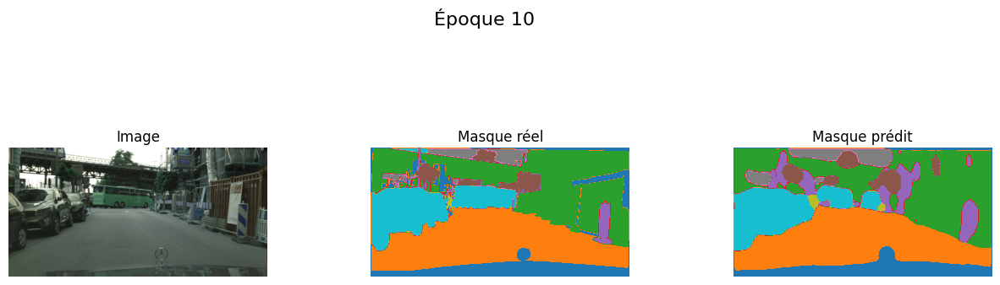

20/20 ━━━━━━━━━━━━━━━━━━━━ 1461s 75s/step - accuracy: 0.8432 - dice_coeff: 0.7758 - dice_loss: 0.2242 - jaccard_score: 0.6343 - loss: 0.0210 - total_loss: 0.3785 - val_accuracy: 0.8308 - val_dice_coeff: 0.7607 - val_dice_loss: 0.2393 - val_jaccard_score: 0.6142 - val_loss: 0.0243 - val_total_loss: 0.3776
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.8568 - dice_coeff: 0.7962 - dice_loss: 0.2038 - jaccard_score: 0.6621 - loss: 0.0194 - total_loss: 0.3593 
Epoch 11: val_jaccard_score did not improve from 0.61421
1/1 ━━━━━━━━━━━━━━━━━━━━ 615s 615s/step


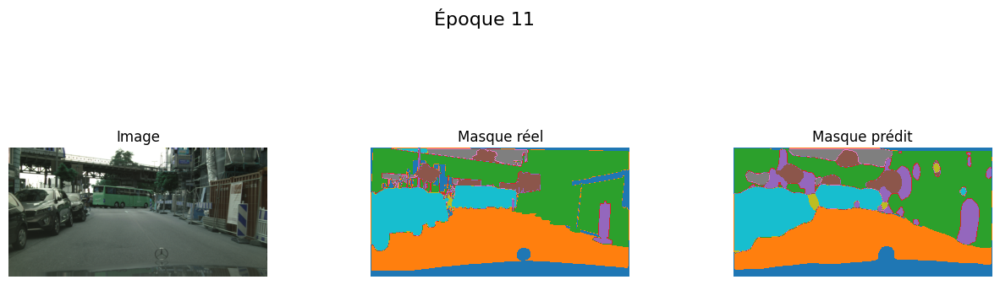

20/20 ━━━━━━━━━━━━━━━━━━━━ 1455s 74s/step - accuracy: 0.8569 - dice_coeff: 0.7965 - dice_loss: 0.2035 - jaccard_score: 0.6625 - loss: 0.0194 - total_loss: 0.3593 - val_accuracy: 0.8094 - val_dice_coeff: 0.7534 - val_dice_loss: 0.2466 - val_jaccard_score: 0.6053 - val_loss: 0.0237 - val_total_loss: 0.4004
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.8672 - dice_coeff: 0.8117 - dice_loss: 0.1883 - jaccard_score: 0.6837 - loss: 0.0166 - total_loss: 0.3546 
Epoch 12: val_jaccard_score improved from 0.61421 to 0.65497, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 609s 609s/step


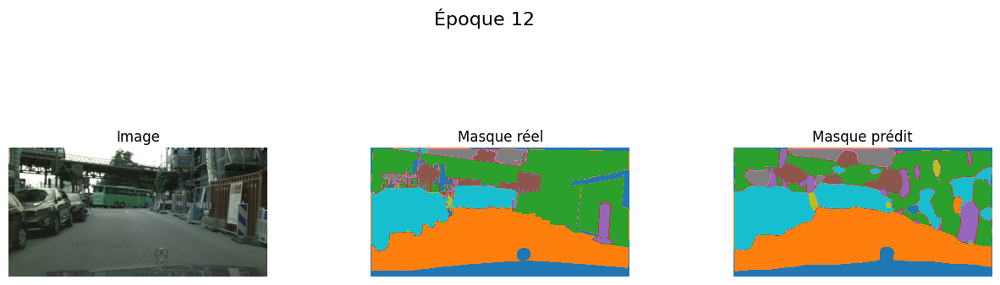

20/20 ━━━━━━━━━━━━━━━━━━━━ 1486s 76s/step - accuracy: 0.8675 - dice_coeff: 0.8121 - dice_loss: 0.1879 - jaccard_score: 0.6843 - loss: 0.0166 - total_loss: 0.3541 - val_accuracy: 0.8410 - val_dice_coeff: 0.7912 - val_dice_loss: 0.2088 - val_jaccard_score: 0.6550 - val_loss: 0.0249 - val_total_loss: 0.3581
Epoch 13/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.8613 - dice_coeff: 0.8078 - dice_loss: 0.1922 - jaccard_score: 0.6782 - loss: 0.0170 - total_loss: 0.3526 
Epoch 13: val_jaccard_score did not improve from 0.65497
1/1 ━━━━━━━━━━━━━━━━━━━━ 635s 635s/step


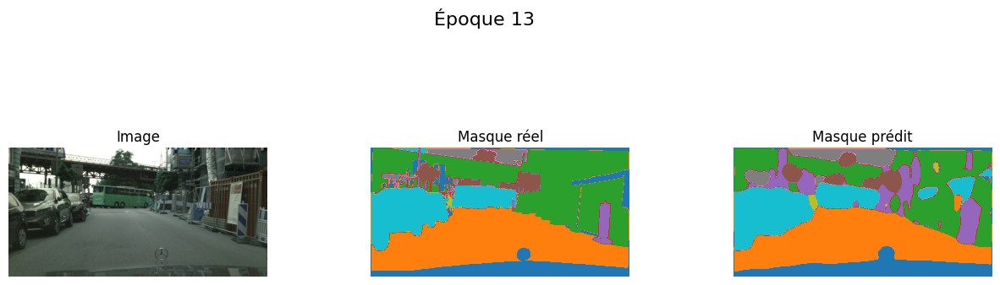

20/20 ━━━━━━━━━━━━━━━━━━━━ 1478s 76s/step - accuracy: 0.8614 - dice_coeff: 0.8080 - dice_loss: 0.1920 - jaccard_score: 0.6786 - loss: 0.0170 - total_loss: 0.3524 - val_accuracy: 0.8059 - val_dice_coeff: 0.7554 - val_dice_loss: 0.2446 - val_jaccard_score: 0.6076 - val_loss: 0.0236 - val_total_loss: 0.3912
Epoch 14/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 39s/step - accuracy: 0.8786 - dice_coeff: 0.8311 - dice_loss: 0.1689 - jaccard_score: 0.7113 - loss: 0.0151 - total_loss: 0.3288 
Epoch 14: val_jaccard_score improved from 0.65497 to 0.69868, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 626s 626s/step


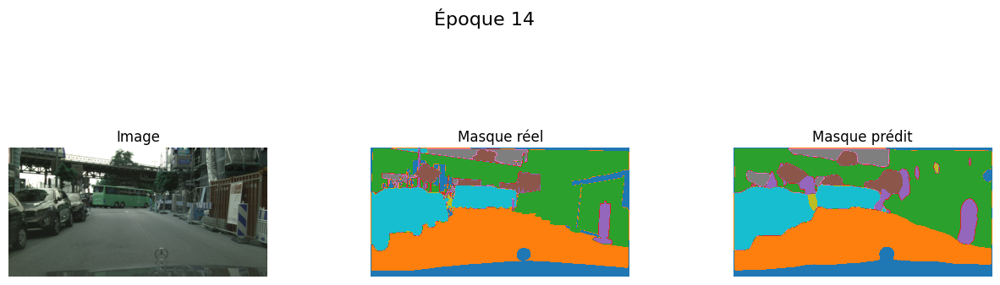

20/20 ━━━━━━━━━━━━━━━━━━━━ 1451s 74s/step - accuracy: 0.8788 - dice_coeff: 0.8314 - dice_loss: 0.1686 - jaccard_score: 0.7118 - loss: 0.0151 - total_loss: 0.3284 - val_accuracy: 0.8626 - val_dice_coeff: 0.8224 - val_dice_loss: 0.1776 - val_jaccard_score: 0.6987 - val_loss: 0.0247 - val_total_loss: 0.3299
Epoch 15/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.8960 - dice_coeff: 0.8558 - dice_loss: 0.1442 - jaccard_score: 0.7483 - loss: 0.0131 - total_loss: 0.3103 
Epoch 15: val_jaccard_score did not improve from 0.69868
1/1 ━━━━━━━━━━━━━━━━━━━━ 605s 605s/step


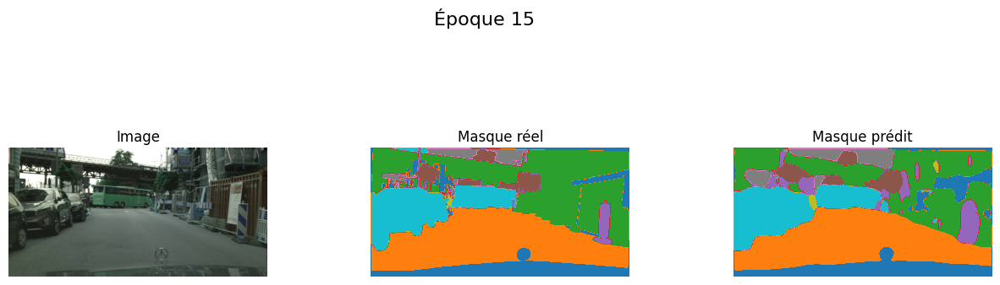

20/20 ━━━━━━━━━━━━━━━━━━━━ 1470s 75s/step - accuracy: 0.8960 - dice_coeff: 0.8559 - dice_loss: 0.1441 - jaccard_score: 0.7484 - loss: 0.0131 - total_loss: 0.3103 - val_accuracy: 0.8561 - val_dice_coeff: 0.8137 - val_dice_loss: 0.1863 - val_jaccard_score: 0.6864 - val_loss: 0.0226 - val_total_loss: 0.3405
Epoch 16/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.9073 - dice_coeff: 0.8710 - dice_loss: 0.1290 - jaccard_score: 0.7720 - loss: 0.0117 - total_loss: 0.3047 
Epoch 16: val_jaccard_score did not improve from 0.69868
1/1 ━━━━━━━━━━━━━━━━━━━━ 600s 600s/step


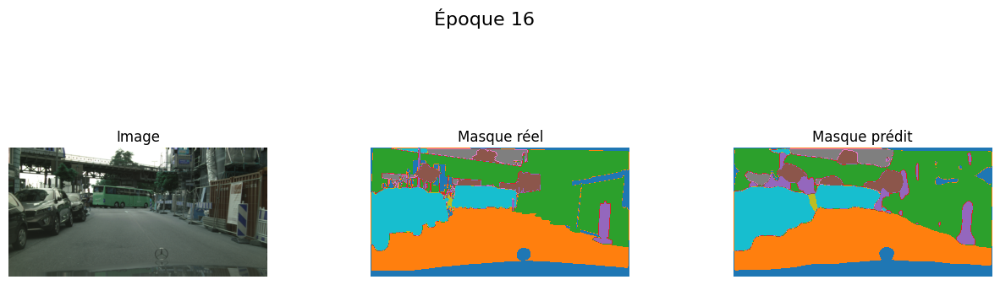

20/20 ━━━━━━━━━━━━━━━━━━━━ 1447s 74s/step - accuracy: 0.9072 - dice_coeff: 0.8710 - dice_loss: 0.1290 - jaccard_score: 0.7719 - loss: 0.0117 - total_loss: 0.3046 - val_accuracy: 0.8508 - val_dice_coeff: 0.8124 - val_dice_loss: 0.1876 - val_jaccard_score: 0.6844 - val_loss: 0.0231 - val_total_loss: 0.3498
Epoch 17/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.9115 - dice_coeff: 0.8785 - dice_loss: 0.1215 - jaccard_score: 0.7836 - loss: 0.0111 - total_loss: 0.3008 
Epoch 17: val_jaccard_score improved from 0.69868 to 0.71302, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 643s 643s/step


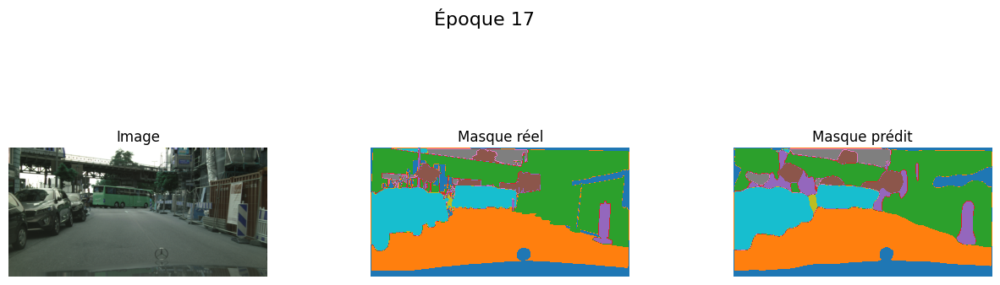

20/20 ━━━━━━━━━━━━━━━━━━━━ 1519s 78s/step - accuracy: 0.9115 - dice_coeff: 0.8785 - dice_loss: 0.1215 - jaccard_score: 0.7836 - loss: 0.0111 - total_loss: 0.3008 - val_accuracy: 0.8634 - val_dice_coeff: 0.8323 - val_dice_loss: 0.1677 - val_jaccard_score: 0.7130 - val_loss: 0.0235 - val_total_loss: 0.3459
Epoch 18/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.9195 - dice_coeff: 0.8904 - dice_loss: 0.1096 - jaccard_score: 0.8029 - loss: 0.0098 - total_loss: 0.2907 
Epoch 18: val_jaccard_score improved from 0.71302 to 0.75237, saving model to best_model_vgg16.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 656s 656s/step


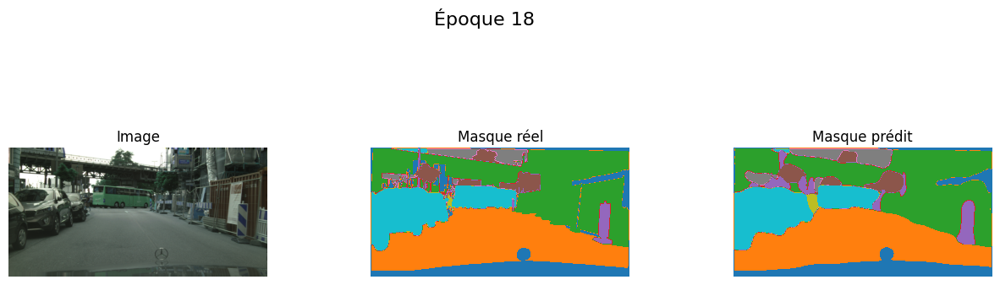

20/20 ━━━━━━━━━━━━━━━━━━━━ 1549s 79s/step - accuracy: 0.9194 - dice_coeff: 0.8903 - dice_loss: 0.1097 - jaccard_score: 0.8028 - loss: 0.0099 - total_loss: 0.2910 - val_accuracy: 0.8819 - val_dice_coeff: 0.8586 - val_dice_loss: 0.1414 - val_jaccard_score: 0.7524 - val_loss: 0.0256 - val_total_loss: 0.3334
Epoch 19/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.9259 - dice_coeff: 0.9009 - dice_loss: 0.0991 - jaccard_score: 0.8199 - loss: 0.0093 - total_loss: 0.2872 
Epoch 19: val_jaccard_score did not improve from 0.75237
1/1 ━━━━━━━━━━━━━━━━━━━━ 666s 666s/step


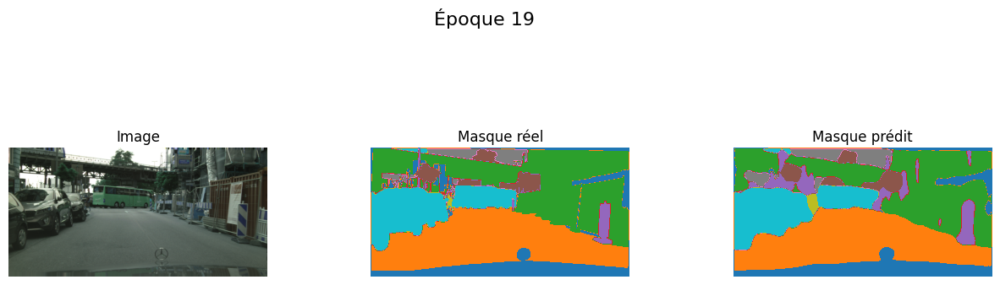

20/20 ━━━━━━━━━━━━━━━━━━━━ 1574s 81s/step - accuracy: 0.9258 - dice_coeff: 0.9008 - dice_loss: 0.0992 - jaccard_score: 0.8196 - loss: 0.0093 - total_loss: 0.2875 - val_accuracy: 0.8603 - val_dice_coeff: 0.8349 - val_dice_loss: 0.1651 - val_jaccard_score: 0.7169 - val_loss: 0.0227 - val_total_loss: 0.3612
Epoch 20/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.9245 - dice_coeff: 0.8991 - dice_loss: 0.1009 - jaccard_score: 0.8172 - loss: 0.0090 - total_loss: 0.3058 
Epoch 20: val_jaccard_score did not improve from 0.75237
1/1 ━━━━━━━━━━━━━━━━━━━━ 654s 654s/step


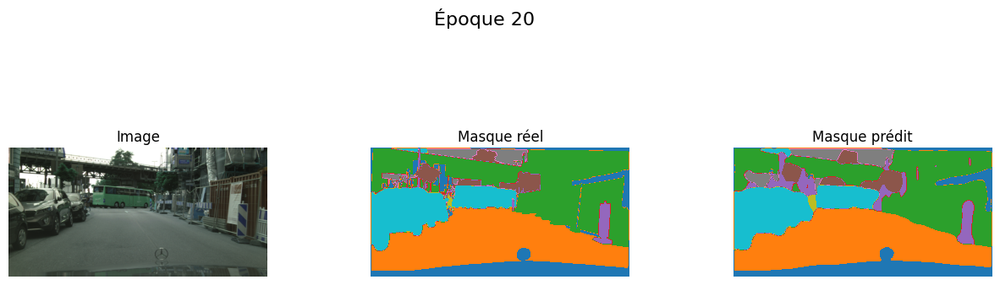

20/20 ━━━━━━━━━━━━━━━━━━━━ 1545s 79s/step - accuracy: 0.9245 - dice_coeff: 0.8992 - dice_loss: 0.1008 - jaccard_score: 0.8174 - loss: 0.0090 - total_loss: 0.3055 - val_accuracy: 0.8728 - val_dice_coeff: 0.8474 - val_dice_loss: 0.1526 - val_jaccard_score: 0.7355 - val_loss: 0.0230 - val_total_loss: 0.3339
Restoring model weights from the end of the best epoch: 18.


In [38]:
# Entraînement du modèle avec le callback
history_vgg16 = vgg16_segmentation_model.fit(
    images,
    masks,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(vgg16_segmentation_model)]
)

## Entraînement avec U-Net

In [27]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [28]:
filename = f"best_model_unet.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [29]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [ ]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

In [31]:
unet_model = unet(input_size=(512, 1024, 3), num_classes=len(cats))

unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.0384 - dice_coeff: 0.1248 - dice_loss: 0.8752 - jaccard_score: 0.0666 - loss: 0.1008 - total_loss: 0.7837  
Epoch 1: val_jaccard_score improved from -inf to 0.06738, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1020s 1020s/step


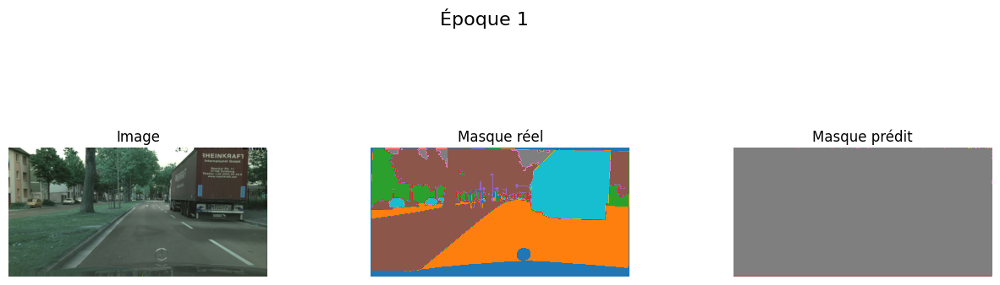

20/20 ━━━━━━━━━━━━━━━━━━━━ 2461s 125s/step - accuracy: 0.0385 - dice_coeff: 0.1248 - dice_loss: 0.8752 - jaccard_score: 0.0666 - loss: 0.1005 - total_loss: 0.7837 - val_accuracy: 0.0416 - val_dice_coeff: 0.1263 - val_dice_loss: 0.8737 - val_jaccard_score: 0.0674 - val_loss: 0.0882 - val_total_loss: 0.7811
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.0389 - dice_coeff: 0.1277 - dice_loss: 0.8723 - jaccard_score: 0.0682 - loss: 0.0882 - total_loss: 0.7793  
Epoch 2: val_jaccard_score improved from 0.06738 to 0.06870, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1017s 1017s/step


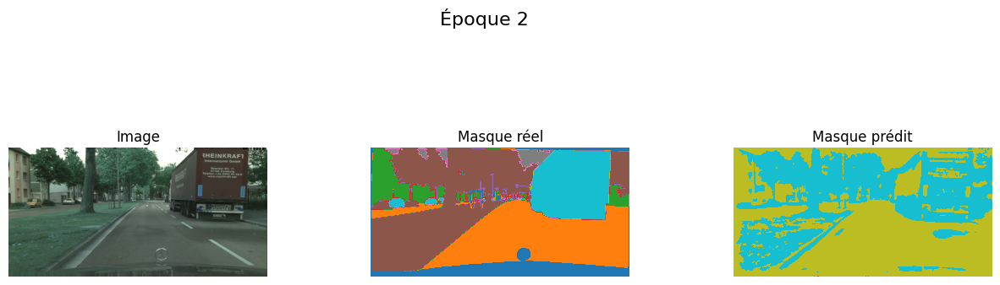

20/20 ━━━━━━━━━━━━━━━━━━━━ 2466s 125s/step - accuracy: 0.0390 - dice_coeff: 0.1276 - dice_loss: 0.8724 - jaccard_score: 0.0682 - loss: 0.0884 - total_loss: 0.7793 - val_accuracy: 0.0488 - val_dice_coeff: 0.1286 - val_dice_loss: 0.8714 - val_jaccard_score: 0.0687 - val_loss: 0.0848 - val_total_loss: 0.7752
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 70s/step - accuracy: 0.0594 - dice_coeff: 0.1324 - dice_loss: 0.8676 - jaccard_score: 0.0709 - loss: 0.0909 - total_loss: 0.7763  
Epoch 3: val_jaccard_score improved from 0.06870 to 0.07802, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1010s 1010s/step


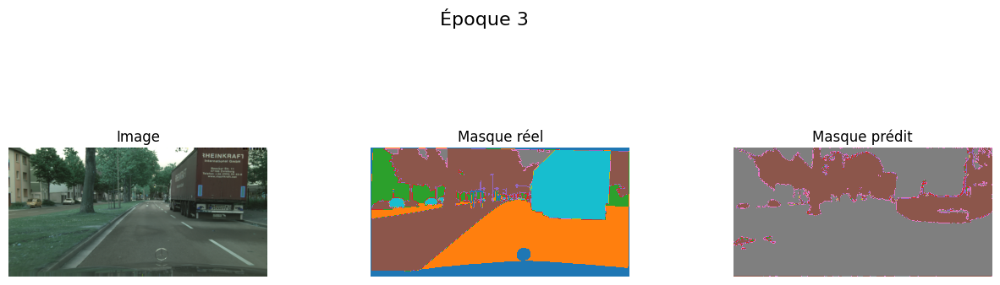

20/20 ━━━━━━━━━━━━━━━━━━━━ 2517s 128s/step - accuracy: 0.0601 - dice_coeff: 0.1325 - dice_loss: 0.8675 - jaccard_score: 0.0710 - loss: 0.0907 - total_loss: 0.7763 - val_accuracy: 0.1709 - val_dice_coeff: 0.1447 - val_dice_loss: 0.8553 - val_jaccard_score: 0.0780 - val_loss: 0.0804 - val_total_loss: 0.7645
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 71s/step - accuracy: 0.1523 - dice_coeff: 0.1491 - dice_loss: 0.8509 - jaccard_score: 0.0806 - loss: 0.0831 - total_loss: 0.7759  
Epoch 4: val_jaccard_score improved from 0.07802 to 0.08415, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1036s 1036s/step


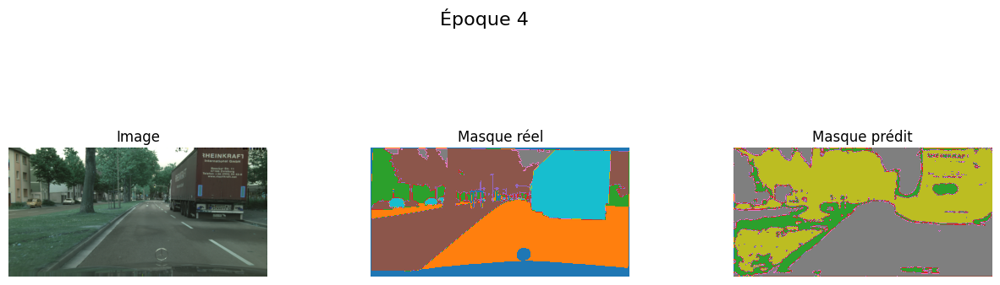

20/20 ━━━━━━━━━━━━━━━━━━━━ 2553s 129s/step - accuracy: 0.1503 - dice_coeff: 0.1491 - dice_loss: 0.8509 - jaccard_score: 0.0806 - loss: 0.0831 - total_loss: 0.7760 - val_accuracy: 0.0850 - val_dice_coeff: 0.1552 - val_dice_loss: 0.8448 - val_jaccard_score: 0.0842 - val_loss: 0.0772 - val_total_loss: 0.7591
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 69s/step - accuracy: 0.2061 - dice_coeff: 0.1696 - dice_loss: 0.8304 - jaccard_score: 0.0927 - loss: 0.0781 - total_loss: 0.7637  
Epoch 5: val_jaccard_score improved from 0.08415 to 0.08532, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1063s 1063s/step


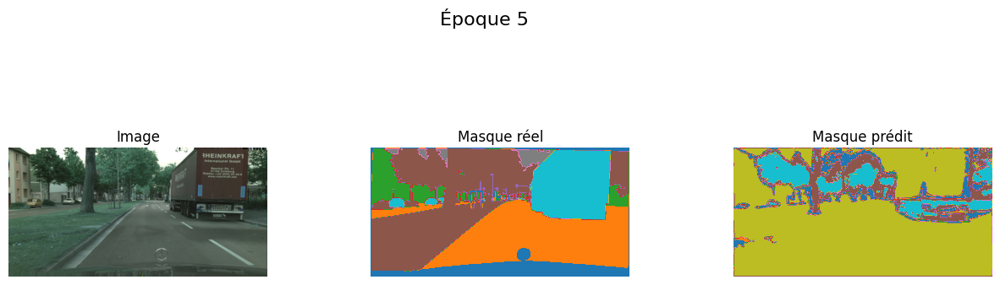

20/20 ━━━━━━━━━━━━━━━━━━━━ 2526s 129s/step - accuracy: 0.2059 - dice_coeff: 0.1696 - dice_loss: 0.8304 - jaccard_score: 0.0927 - loss: 0.0783 - total_loss: 0.7640 - val_accuracy: 0.0709 - val_dice_coeff: 0.1571 - val_dice_loss: 0.8429 - val_jaccard_score: 0.0853 - val_loss: 0.0800 - val_total_loss: 0.7577
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 69s/step - accuracy: 0.1631 - dice_coeff: 0.1609 - dice_loss: 0.8391 - jaccard_score: 0.0876 - loss: 0.0809 - total_loss: 0.7742  
Epoch 6: val_jaccard_score improved from 0.08532 to 0.09508, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1069s 1069s/step


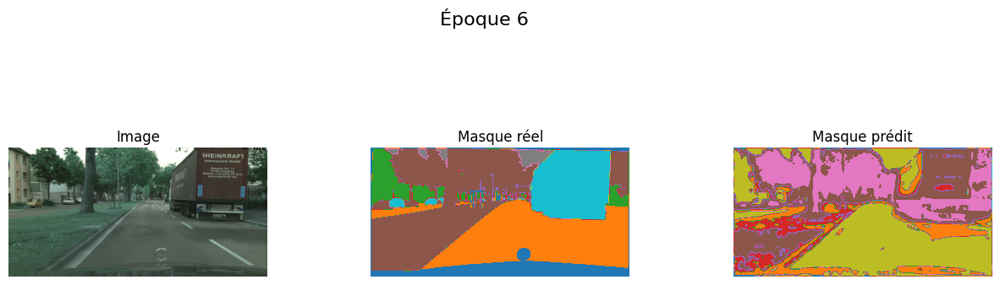

20/20 ━━━━━━━━━━━━━━━━━━━━ 2511s 128s/step - accuracy: 0.1653 - dice_coeff: 0.1614 - dice_loss: 0.8386 - jaccard_score: 0.0879 - loss: 0.0809 - total_loss: 0.7739 - val_accuracy: 0.2644 - val_dice_coeff: 0.1736 - val_dice_loss: 0.8264 - val_jaccard_score: 0.0951 - val_loss: 0.0737 - val_total_loss: 0.7485
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 68s/step - accuracy: 0.3223 - dice_coeff: 0.1865 - dice_loss: 0.8135 - jaccard_score: 0.1029 - loss: 0.0777 - total_loss: 0.7636  
Epoch 7: val_jaccard_score improved from 0.09508 to 0.11590, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1052s 1052s/step


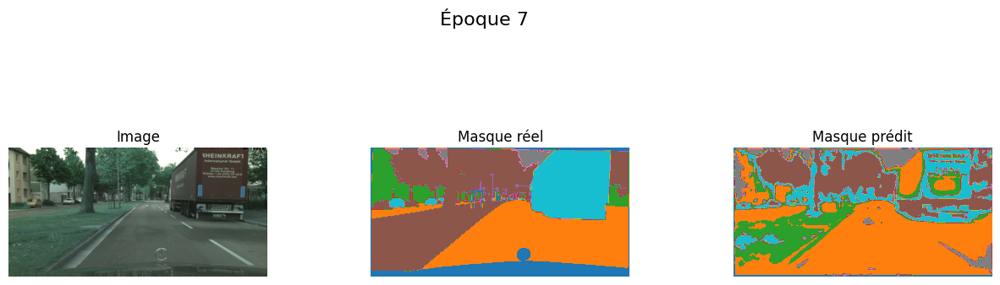

20/20 ━━━━━━━━━━━━━━━━━━━━ 2477s 126s/step - accuracy: 0.3238 - dice_coeff: 0.1867 - dice_loss: 0.8133 - jaccard_score: 0.1031 - loss: 0.0776 - total_loss: 0.7641 - val_accuracy: 0.4843 - val_dice_coeff: 0.2076 - val_dice_loss: 0.7924 - val_jaccard_score: 0.1159 - val_loss: 0.0698 - val_total_loss: 0.7449
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 69s/step - accuracy: 0.4405 - dice_coeff: 0.2157 - dice_loss: 0.7843 - jaccard_score: 0.1209 - loss: 0.0723 - total_loss: 0.7500  
Epoch 8: val_jaccard_score improved from 0.11590 to 0.11817, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1048s 1048s/step


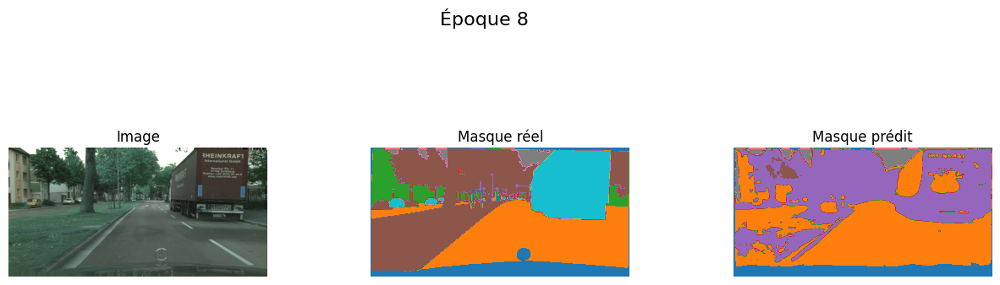

20/20 ━━━━━━━━━━━━━━━━━━━━ 2488s 127s/step - accuracy: 0.4396 - dice_coeff: 0.2156 - dice_loss: 0.7844 - jaccard_score: 0.1209 - loss: 0.0725 - total_loss: 0.7501 - val_accuracy: 0.4413 - val_dice_coeff: 0.2113 - val_dice_loss: 0.7887 - val_jaccard_score: 0.1182 - val_loss: 0.0676 - val_total_loss: 0.7174
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 65s/step - accuracy: 0.3867 - dice_coeff: 0.2409 - dice_loss: 0.7591 - jaccard_score: 0.1373 - loss: 0.0675 - total_loss: 0.7273  
Epoch 9: val_jaccard_score improved from 0.11817 to 0.14936, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1042s 1042s/step


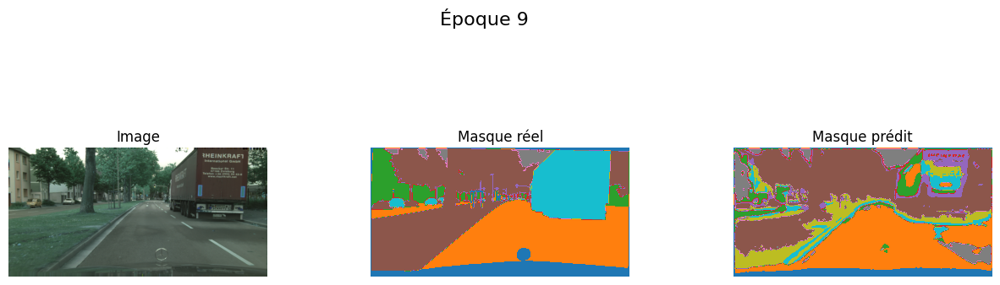

20/20 ━━━━━━━━━━━━━━━━━━━━ 2435s 124s/step - accuracy: 0.3887 - dice_coeff: 0.2420 - dice_loss: 0.7580 - jaccard_score: 0.1380 - loss: 0.0676 - total_loss: 0.7268 - val_accuracy: 0.4779 - val_dice_coeff: 0.2596 - val_dice_loss: 0.7404 - val_jaccard_score: 0.1494 - val_loss: 0.0643 - val_total_loss: 0.7240
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.4098 - dice_coeff: 0.2740 - dice_loss: 0.7260 - jaccard_score: 0.1593 - loss: 0.0690 - total_loss: 0.7304  
Epoch 10: val_jaccard_score improved from 0.14936 to 0.22893, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1027s 1027s/step


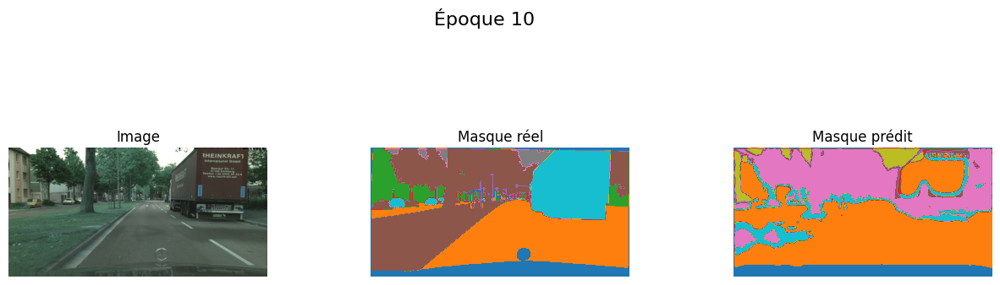

20/20 ━━━━━━━━━━━━━━━━━━━━ 2470s 125s/step - accuracy: 0.4111 - dice_coeff: 0.2751 - dice_loss: 0.7249 - jaccard_score: 0.1601 - loss: 0.0690 - total_loss: 0.7295 - val_accuracy: 0.5526 - val_dice_coeff: 0.3721 - val_dice_loss: 0.6279 - val_jaccard_score: 0.2289 - val_loss: 0.0613 - val_total_loss: 0.6653
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.5700 - dice_coeff: 0.3803 - dice_loss: 0.6197 - jaccard_score: 0.2354 - loss: 0.0648 - total_loss: 0.6712  
Epoch 11: val_jaccard_score improved from 0.22893 to 0.26043, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1033s 1033s/step


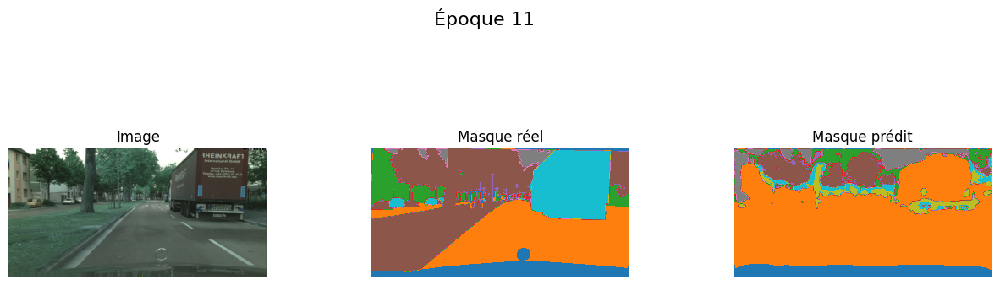

20/20 ━━━━━━━━━━━━━━━━━━━━ 2486s 126s/step - accuracy: 0.5691 - dice_coeff: 0.3802 - dice_loss: 0.6198 - jaccard_score: 0.2353 - loss: 0.0647 - total_loss: 0.6717 - val_accuracy: 0.5474 - val_dice_coeff: 0.4130 - val_dice_loss: 0.5870 - val_jaccard_score: 0.2604 - val_loss: 0.0667 - val_total_loss: 0.6431
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 65s/step - accuracy: 0.5656 - dice_coeff: 0.3895 - dice_loss: 0.6105 - jaccard_score: 0.2438 - loss: 0.0617 - total_loss: 0.6507  
Epoch 12: val_jaccard_score did not improve from 0.26043
1/1 ━━━━━━━━━━━━━━━━━━━━ 1042s 1042s/step


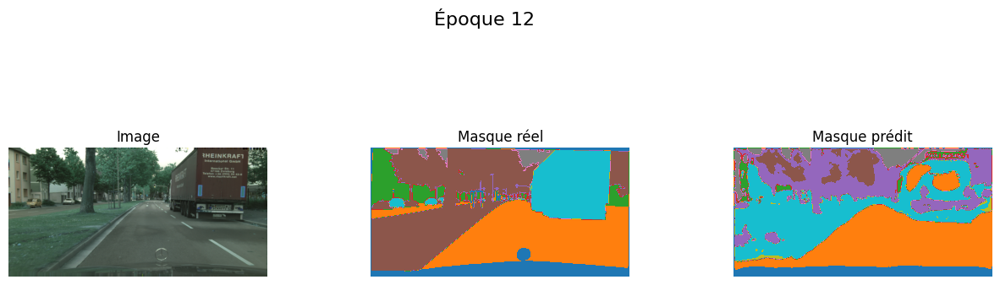

20/20 ━━━━━━━━━━━━━━━━━━━━ 2459s 124s/step - accuracy: 0.5655 - dice_coeff: 0.3896 - dice_loss: 0.6104 - jaccard_score: 0.2437 - loss: 0.0617 - total_loss: 0.6509 - val_accuracy: 0.5008 - val_dice_coeff: 0.3376 - val_dice_loss: 0.6624 - val_jaccard_score: 0.2033 - val_loss: 0.0581 - val_total_loss: 0.6541
Epoch 13/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.5093 - dice_coeff: 0.3801 - dice_loss: 0.6199 - jaccard_score: 0.2367 - loss: 0.0615 - total_loss: 0.6620  
Epoch 13: val_jaccard_score did not improve from 0.26043
1/1 ━━━━━━━━━━━━━━━━━━━━ 1045s 1045s/step


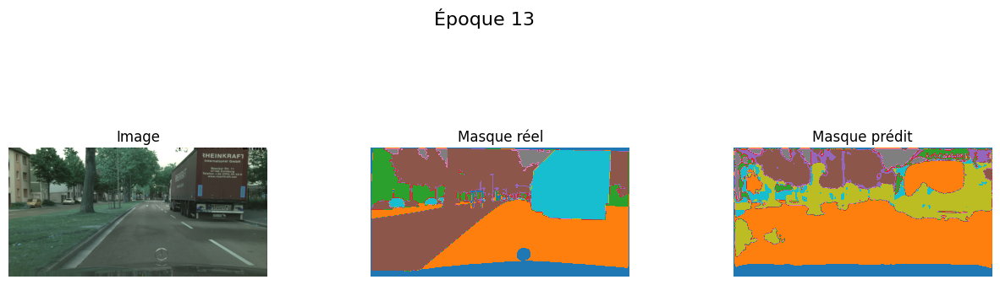

20/20 ━━━━━━━━━━━━━━━━━━━━ 2459s 125s/step - accuracy: 0.5088 - dice_coeff: 0.3797 - dice_loss: 0.6203 - jaccard_score: 0.2364 - loss: 0.0616 - total_loss: 0.6625 - val_accuracy: 0.5289 - val_dice_coeff: 0.3686 - val_dice_loss: 0.6314 - val_jaccard_score: 0.2262 - val_loss: 0.0589 - val_total_loss: 0.6441
Epoch 14/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 77s/step - accuracy: 0.5735 - dice_coeff: 0.4220 - dice_loss: 0.5780 - jaccard_score: 0.2680 - loss: 0.0579 - total_loss: 0.6402  
Epoch 14: val_jaccard_score did not improve from 0.26043
1/1 ━━━━━━━━━━━━━━━━━━━━ 1002s 1002s/step


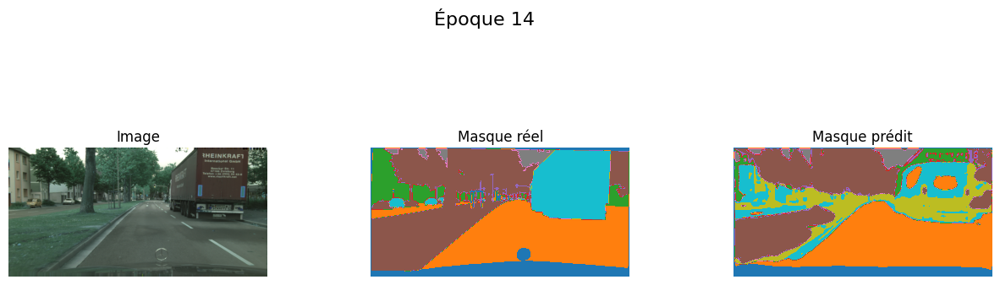

20/20 ━━━━━━━━━━━━━━━━━━━━ 2647s 134s/step - accuracy: 0.5736 - dice_coeff: 0.4230 - dice_loss: 0.5770 - jaccard_score: 0.2688 - loss: 0.0579 - total_loss: 0.6401 - val_accuracy: 0.5385 - val_dice_coeff: 0.3906 - val_dice_loss: 0.6094 - val_jaccard_score: 0.2431 - val_loss: 0.0547 - val_total_loss: 0.6567
Epoch 15/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 66s/step - accuracy: 0.4911 - dice_coeff: 0.3798 - dice_loss: 0.6202 - jaccard_score: 0.2361 - loss: 0.0626 - total_loss: 0.6913  
Epoch 15: val_jaccard_score improved from 0.26043 to 0.30918, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1055s 1055s/step


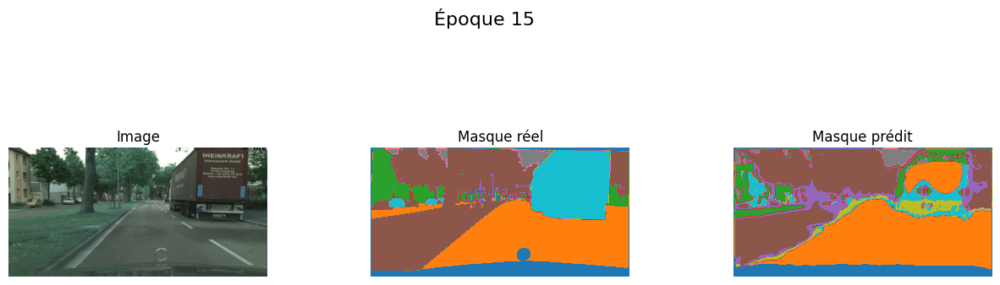

20/20 ━━━━━━━━━━━━━━━━━━━━ 2475s 125s/step - accuracy: 0.4932 - dice_coeff: 0.3812 - dice_loss: 0.6188 - jaccard_score: 0.2372 - loss: 0.0623 - total_loss: 0.6901 - val_accuracy: 0.6251 - val_dice_coeff: 0.4715 - val_dice_loss: 0.5285 - val_jaccard_score: 0.3092 - val_loss: 0.0518 - val_total_loss: 0.6214
Epoch 16/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 71s/step - accuracy: 0.6018 - dice_coeff: 0.4778 - dice_loss: 0.5222 - jaccard_score: 0.3168 - loss: 0.0541 - total_loss: 0.6306  
Epoch 16: val_jaccard_score did not improve from 0.30918
1/1 ━━━━━━━━━━━━━━━━━━━━ 1005s 1005s/step


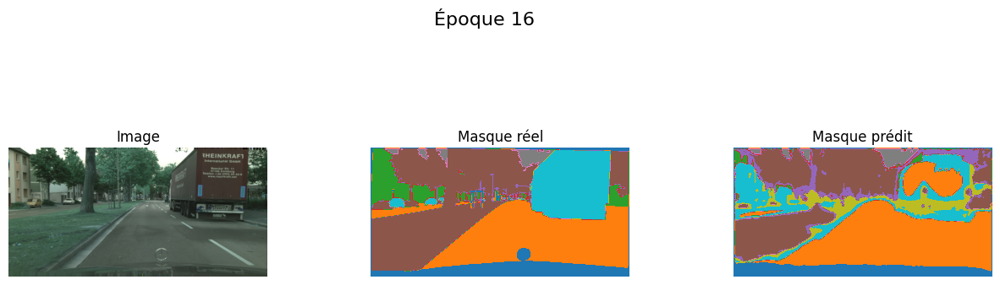

20/20 ━━━━━━━━━━━━━━━━━━━━ 2528s 127s/step - accuracy: 0.5996 - dice_coeff: 0.4752 - dice_loss: 0.5248 - jaccard_score: 0.3147 - loss: 0.0544 - total_loss: 0.6313 - val_accuracy: 0.5866 - val_dice_coeff: 0.3996 - val_dice_loss: 0.6004 - val_jaccard_score: 0.2502 - val_loss: 0.0598 - val_total_loss: 0.6472
Epoch 17/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 86s/step - accuracy: 0.5779 - dice_coeff: 0.4513 - dice_loss: 0.5487 - jaccard_score: 0.2935 - loss: 0.0623 - total_loss: 0.6549  
Epoch 17: val_jaccard_score improved from 0.30918 to 0.32236, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1031s 1031s/step


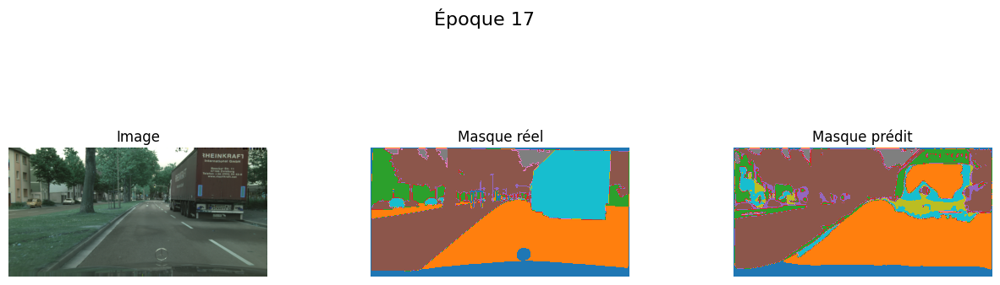

20/20 ━━━━━━━━━━━━━━━━━━━━ 2857s 144s/step - accuracy: 0.5777 - dice_coeff: 0.4518 - dice_loss: 0.5482 - jaccard_score: 0.2939 - loss: 0.0620 - total_loss: 0.6550 - val_accuracy: 0.6345 - val_dice_coeff: 0.4864 - val_dice_loss: 0.5136 - val_jaccard_score: 0.3224 - val_loss: 0.0517 - val_total_loss: 0.6162
Epoch 18/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 79s/step - accuracy: 0.6096 - dice_coeff: 0.4855 - dice_loss: 0.5145 - jaccard_score: 0.3211 - loss: 0.0567 - total_loss: 0.6236  
Epoch 18: val_jaccard_score did not improve from 0.32236
1/1 ━━━━━━━━━━━━━━━━━━━━ 1068s 1068s/step


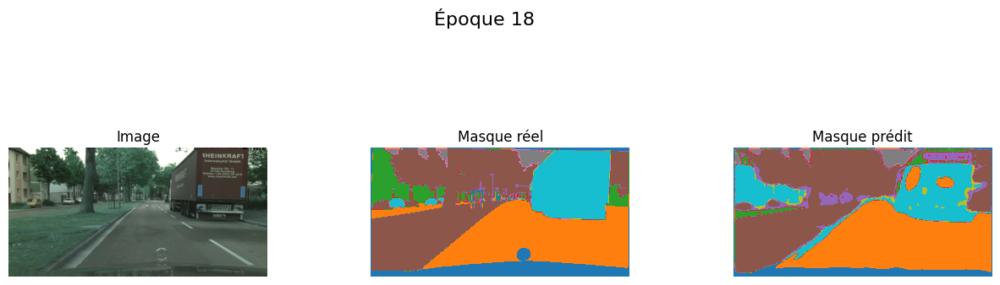

20/20 ━━━━━━━━━━━━━━━━━━━━ 2736s 138s/step - accuracy: 0.6095 - dice_coeff: 0.4858 - dice_loss: 0.5142 - jaccard_score: 0.3214 - loss: 0.0565 - total_loss: 0.6239 - val_accuracy: 0.5908 - val_dice_coeff: 0.4835 - val_dice_loss: 0.5165 - val_jaccard_score: 0.3197 - val_loss: 0.0536 - val_total_loss: 0.6551
Epoch 19/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 76s/step - accuracy: 0.6161 - dice_coeff: 0.4976 - dice_loss: 0.5024 - jaccard_score: 0.3333 - loss: 0.0499 - total_loss: 0.6343  
Epoch 19: val_jaccard_score improved from 0.32236 to 0.33228, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1000s 1000s/step


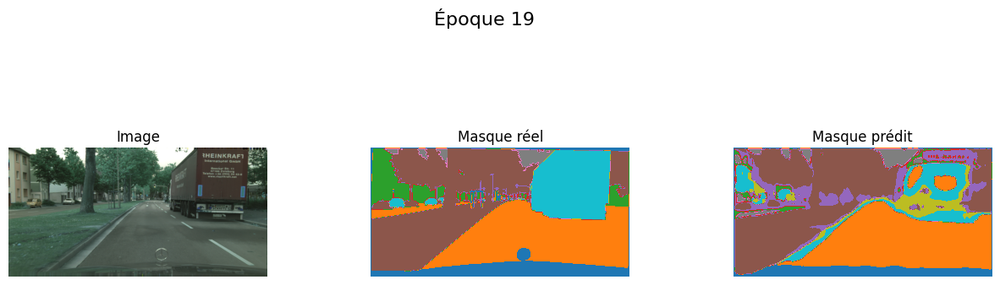

20/20 ━━━━━━━━━━━━━━━━━━━━ 2591s 131s/step - accuracy: 0.6162 - dice_coeff: 0.4978 - dice_loss: 0.5022 - jaccard_score: 0.3334 - loss: 0.0500 - total_loss: 0.6343 - val_accuracy: 0.5873 - val_dice_coeff: 0.4973 - val_dice_loss: 0.5027 - val_jaccard_score: 0.3323 - val_loss: 0.0496 - val_total_loss: 0.6543
Epoch 20/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 69s/step - accuracy: 0.5782 - dice_coeff: 0.4848 - dice_loss: 0.5152 - jaccard_score: 0.3209 - loss: 0.0498 - total_loss: 0.6531  
Epoch 20: val_jaccard_score improved from 0.33228 to 0.38575, saving model to best_model_unet.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 990s 990s/step


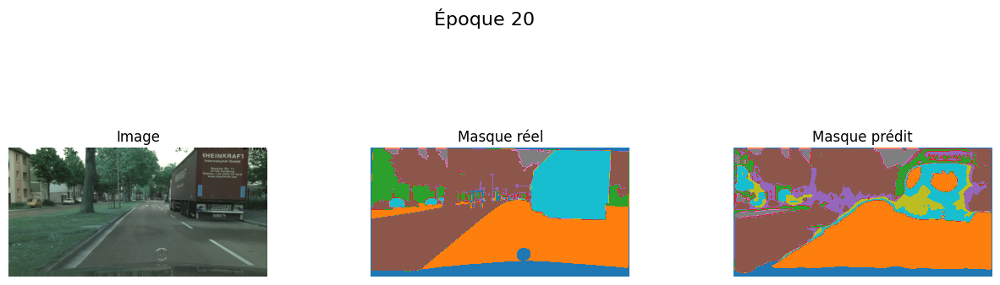

20/20 ━━━━━━━━━━━━━━━━━━━━ 2460s 125s/step - accuracy: 0.5794 - dice_coeff: 0.4853 - dice_loss: 0.5147 - jaccard_score: 0.3213 - loss: 0.0499 - total_loss: 0.6528 - val_accuracy: 0.6427 - val_dice_coeff: 0.5557 - val_dice_loss: 0.4443 - val_jaccard_score: 0.3857 - val_loss: 0.0469 - val_total_loss: 0.6273
Restoring model weights from the end of the best epoch: 20.


In [32]:
history_unet = unet_model.fit(
    images,
    masks,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(unet_model)]
)

# Avec data augmentation

## Avec Albumentations

### Fonctions

In [26]:
# Fonction de data augmentation avec albumentations
def augment_data_albumentations(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec redimensionnement
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),            # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),              # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                 # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),     # Zoom de 80% à 120%
        A.Resize(256, 512)                  # Redimensionnement pour garantir une taille constante
    ])

    # Redimensionner à la taille d'entraînement
    resize_to_train = A.Resize(512, 1024)
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        # Étape 1 : Appliquer les transformations
        augmented = transform(image=img, mask=mask)
        
        # Étape 2 : Redimensionner pour correspondre à la taille d'entrée du modèle
        resized = resize_to_train(image=augmented['image'], mask=augmented['mask'])
        
        # Ajouter les images et masques redimensionnés
        images_aug.append(resized['image'])
        masks_aug.append(resized['mask'])
    
    # Convertir les données en numpy array avec float32
    return np.array(images_aug, dtype=np.float32), np.array(masks_aug, dtype=np.float32)

In [27]:
# Fonction de data augmentation avec transformations supplémentaires
def augment_data_albumentations_extended(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec des manipulations supplémentaires
    transform = A.Compose([
        # Transformations de la première fonction
        A.HorizontalFlip(p=0.5),                # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),                  # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                     # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),         # Zoom de 80% à 120%
        
        # Transformations supplémentaires
        A.RandomBrightnessContrast(p=0.2),      # Ajuste la luminosité et le contraste
        A.GaussianBlur(blur_limit=(3, 7), p=0.2), # Applique un flou gaussien avec une certaine probabilité
        A.HueSaturationValue(p=0.3),            # Modifie la teinte, la saturation et la valeur des couleurs
        A.ElasticTransform(p=0.1),              # Applique des distorsions élastiques (déformation non linéaire)
        A.GridDistortion(p=0.1),                # Applique une distorsion en grille pour un effet de déformation
        A.Resize(256, 512)                      # Redimensionnement pour garantir une taille constante
    ])

    # Redimensionner à la taille d'entraînement
    resize_to_train = A.Resize(512, 1024)
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        # Étape 1 : Appliquer les transformations
        augmented = transform(image=img, mask=mask)
        
        # Étape 2 : Redimensionner pour correspondre à la taille d'entrée du modèle
        resized = resize_to_train(image=augmented['image'], mask=augmented['mask'])
        
        # Ajouter les images et masques redimensionnés
        images_aug.append(resized['image'])
        masks_aug.append(resized['mask'])
    
    # Convertir les données en numpy array avec float32
    return np.array(images_aug, dtype=np.float32), np.array(masks_aug, dtype=np.float32)

### Entraînement du modèle

#### Data augmentation simple

In [208]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [209]:
filename = f"best_model_albumentations_1.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [210]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [ ]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

In [211]:
# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(512, 1024, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
x = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model_albu_simple = Model(inputs=base_model.input, outputs=x)

# Compilation du modèle
model_albu_simple.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

In [212]:
# Utilisation de la fonction d'augmentation avec albumentations
images_aug, masks_aug = augment_data_albumentations(df_train_sample)

print("Shape des images :", images_aug.shape)  # (N, 512, 1024, 3)
print("Shape des masques :", masks_aug.shape)  # (N, 512, 1024, nombre_de_classes)

Shape des images : (100, 512, 1024, 3)
Shape des masques : (100, 512, 1024, 8)


Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1961 - dice_coeff: 0.1422 - dice_loss: 0.8578 - jaccard_score: 0.0770 - loss: 0.1005 - total_loss: 0.7770 
Epoch 1: val_jaccard_score improved from -inf to 0.15417, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 686s 686s/step


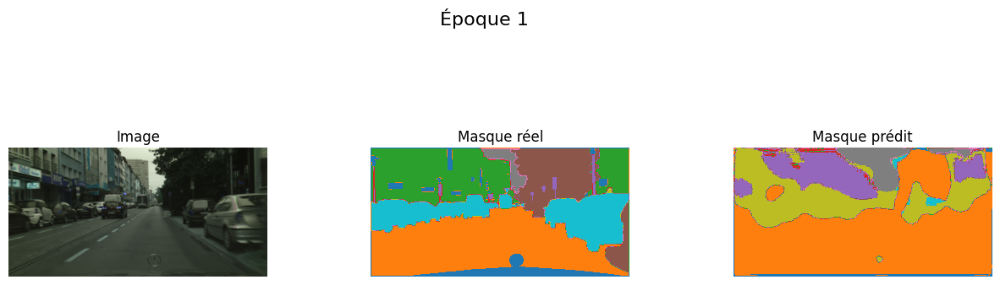

20/20 ━━━━━━━━━━━━━━━━━━━━ 1568s 80s/step - accuracy: 0.2013 - dice_coeff: 0.1438 - dice_loss: 0.8562 - jaccard_score: 0.0779 - loss: 0.1001 - total_loss: 0.7761 - val_accuracy: 0.4327 - val_dice_coeff: 0.2671 - val_dice_loss: 0.7329 - val_jaccard_score: 0.1542 - val_loss: 0.0732 - val_total_loss: 0.7004
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 44s/step - accuracy: 0.4388 - dice_coeff: 0.2893 - dice_loss: 0.7107 - jaccard_score: 0.1699 - loss: 0.0723 - total_loss: 0.6827 
Epoch 2: val_jaccard_score improved from 0.15417 to 0.26544, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 634s 634s/step


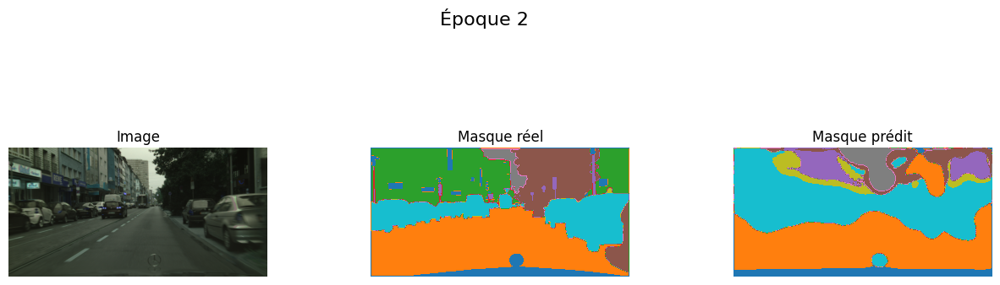

20/20 ━━━━━━━━━━━━━━━━━━━━ 1577s 80s/step - accuracy: 0.4403 - dice_coeff: 0.2903 - dice_loss: 0.7097 - jaccard_score: 0.1707 - loss: 0.0723 - total_loss: 0.6820 - val_accuracy: 0.4883 - val_dice_coeff: 0.4185 - val_dice_loss: 0.5815 - val_jaccard_score: 0.2654 - val_loss: 0.0675 - val_total_loss: 0.6398
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 44s/step - accuracy: 0.5213 - dice_coeff: 0.4170 - dice_loss: 0.5830 - jaccard_score: 0.2649 - loss: 0.0637 - total_loss: 0.6157 
Epoch 3: val_jaccard_score improved from 0.26544 to 0.34421, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 679s 679s/step


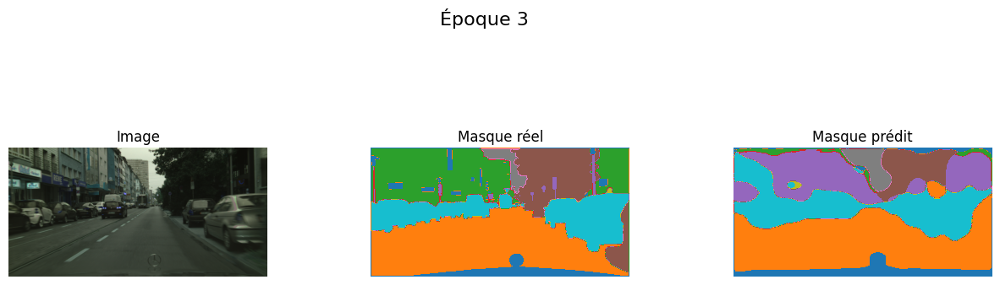

20/20 ━━━━━━━━━━━━━━━━━━━━ 1607s 82s/step - accuracy: 0.5219 - dice_coeff: 0.4168 - dice_loss: 0.5832 - jaccard_score: 0.2648 - loss: 0.0636 - total_loss: 0.6154 - val_accuracy: 0.5738 - val_dice_coeff: 0.5113 - val_dice_loss: 0.4887 - val_jaccard_score: 0.3442 - val_loss: 0.0501 - val_total_loss: 0.5904
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.5946 - dice_coeff: 0.5067 - dice_loss: 0.4933 - jaccard_score: 0.3411 - loss: 0.0523 - total_loss: 0.5793 
Epoch 4: val_jaccard_score improved from 0.34421 to 0.38692, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 689s 689s/step


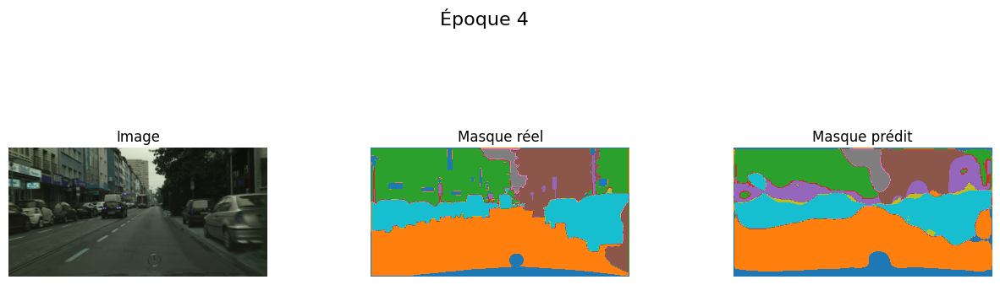

20/20 ━━━━━━━━━━━━━━━━━━━━ 1568s 80s/step - accuracy: 0.5962 - dice_coeff: 0.5070 - dice_loss: 0.4930 - jaccard_score: 0.3414 - loss: 0.0523 - total_loss: 0.5788 - val_accuracy: 0.6734 - val_dice_coeff: 0.5572 - val_dice_loss: 0.4428 - val_jaccard_score: 0.3869 - val_loss: 0.0417 - val_total_loss: 0.5517
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 45s/step - accuracy: 0.6886 - dice_coeff: 0.5819 - dice_loss: 0.4181 - jaccard_score: 0.4121 - loss: 0.0430 - total_loss: 0.5448 
Epoch 5: val_jaccard_score did not improve from 0.38692
1/1 ━━━━━━━━━━━━━━━━━━━━ 657s 657s/step


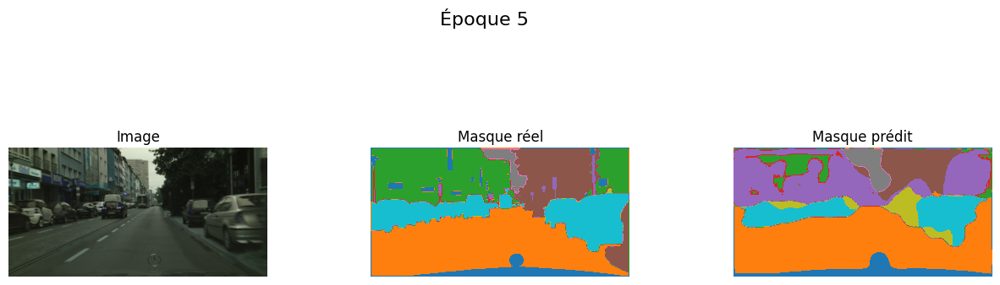

20/20 ━━━━━━━━━━━━━━━━━━━━ 1609s 82s/step - accuracy: 0.6878 - dice_coeff: 0.5812 - dice_loss: 0.4188 - jaccard_score: 0.4114 - loss: 0.0430 - total_loss: 0.5454 - val_accuracy: 0.6046 - val_dice_coeff: 0.5090 - val_dice_loss: 0.4910 - val_jaccard_score: 0.3418 - val_loss: 0.0426 - val_total_loss: 0.5728
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.7008 - dice_coeff: 0.5653 - dice_loss: 0.4347 - jaccard_score: 0.3951 - loss: 0.0434 - total_loss: 0.5569 
Epoch 6: val_jaccard_score did not improve from 0.38692
1/1 ━━━━━━━━━━━━━━━━━━━━ 689s 689s/step


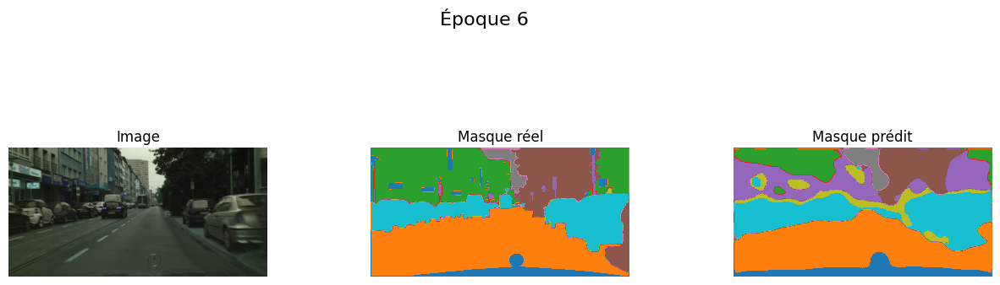

20/20 ━━━━━━━━━━━━━━━━━━━━ 1610s 82s/step - accuracy: 0.7014 - dice_coeff: 0.5654 - dice_loss: 0.4346 - jaccard_score: 0.3952 - loss: 0.0434 - total_loss: 0.5569 - val_accuracy: 0.5950 - val_dice_coeff: 0.5223 - val_dice_loss: 0.4777 - val_jaccard_score: 0.3552 - val_loss: 0.0439 - val_total_loss: 0.5903
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 44s/step - accuracy: 0.6916 - dice_coeff: 0.6027 - dice_loss: 0.3973 - jaccard_score: 0.4324 - loss: 0.0408 - total_loss: 0.5495 
Epoch 7: val_jaccard_score improved from 0.38692 to 0.43532, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 685s 685s/step


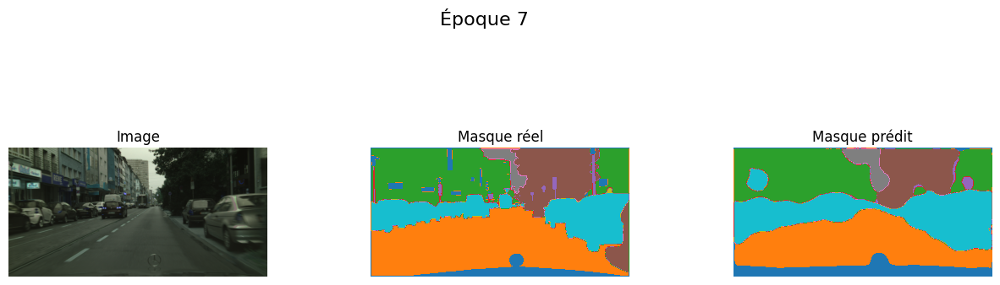

20/20 ━━━━━━━━━━━━━━━━━━━━ 1607s 82s/step - accuracy: 0.6930 - dice_coeff: 0.6033 - dice_loss: 0.3967 - jaccard_score: 0.4330 - loss: 0.0407 - total_loss: 0.5491 - val_accuracy: 0.7188 - val_dice_coeff: 0.6048 - val_dice_loss: 0.3952 - val_jaccard_score: 0.4353 - val_loss: 0.0389 - val_total_loss: 0.5417
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.7538 - dice_coeff: 0.6533 - dice_loss: 0.3467 - jaccard_score: 0.4861 - loss: 0.0347 - total_loss: 0.5217 
Epoch 8: val_jaccard_score improved from 0.43532 to 0.44649, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 718s 718s/step


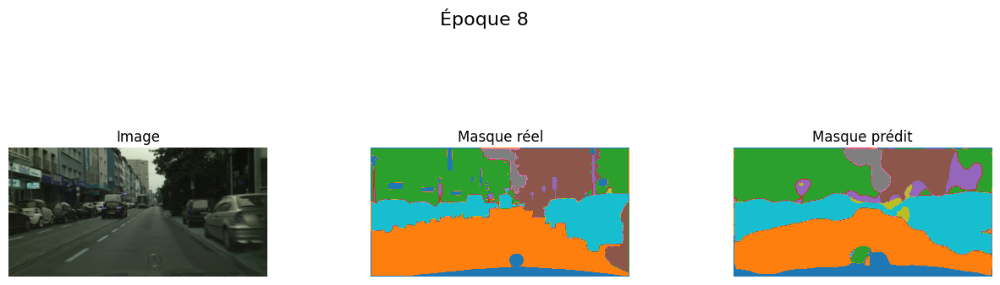

20/20 ━━━━━━━━━━━━━━━━━━━━ 1650s 84s/step - accuracy: 0.7539 - dice_coeff: 0.6538 - dice_loss: 0.3462 - jaccard_score: 0.4867 - loss: 0.0346 - total_loss: 0.5220 - val_accuracy: 0.7238 - val_dice_coeff: 0.6163 - val_dice_loss: 0.3837 - val_jaccard_score: 0.4465 - val_loss: 0.0342 - val_total_loss: 0.5595
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.7629 - dice_coeff: 0.6697 - dice_loss: 0.3303 - jaccard_score: 0.5043 - loss: 0.0312 - total_loss: 0.5340 
Epoch 9: val_jaccard_score improved from 0.44649 to 0.50063, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 787s 787s/step


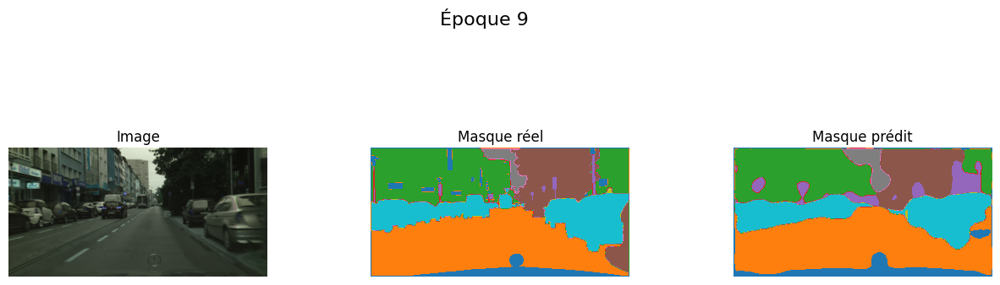

20/20 ━━━━━━━━━━━━━━━━━━━━ 1775s 91s/step - accuracy: 0.7632 - dice_coeff: 0.6701 - dice_loss: 0.3299 - jaccard_score: 0.5048 - loss: 0.0312 - total_loss: 0.5335 - val_accuracy: 0.7480 - val_dice_coeff: 0.6665 - val_dice_loss: 0.3335 - val_jaccard_score: 0.5006 - val_loss: 0.0326 - val_total_loss: 0.5494
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 65s/step - accuracy: 0.7969 - dice_coeff: 0.7213 - dice_loss: 0.2787 - jaccard_score: 0.5646 - loss: 0.0265 - total_loss: 0.5218  
Epoch 10: val_jaccard_score improved from 0.50063 to 0.53809, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 896s 896s/step


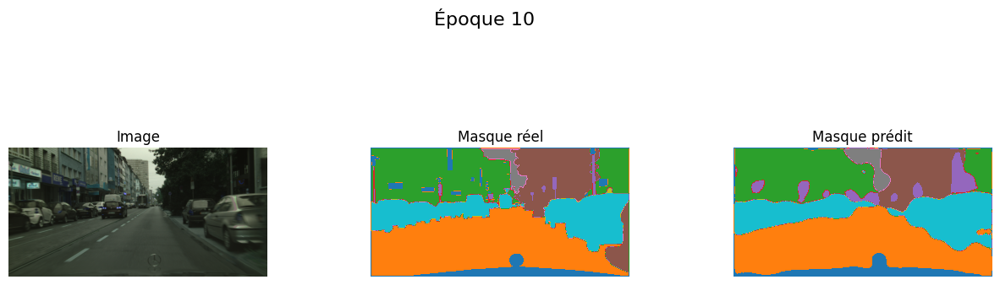

20/20 ━━━━━━━━━━━━━━━━━━━━ 2280s 116s/step - accuracy: 0.7968 - dice_coeff: 0.7213 - dice_loss: 0.2787 - jaccard_score: 0.5646 - loss: 0.0265 - total_loss: 0.5220 - val_accuracy: 0.7898 - val_dice_coeff: 0.6990 - val_dice_loss: 0.3010 - val_jaccard_score: 0.5381 - val_loss: 0.0311 - val_total_loss: 0.5421
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 67s/step - accuracy: 0.8094 - dice_coeff: 0.7287 - dice_loss: 0.2713 - jaccard_score: 0.5745 - loss: 0.0268 - total_loss: 0.5203  
Epoch 11: val_jaccard_score did not improve from 0.53809
1/1 ━━━━━━━━━━━━━━━━━━━━ 676s 676s/step


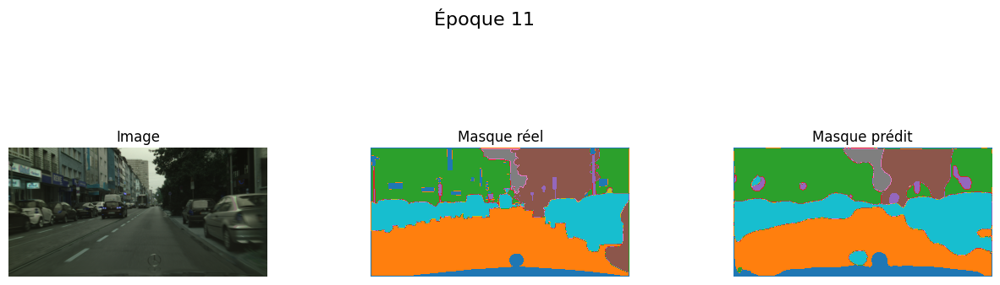

20/20 ━━━━━━━━━━━━━━━━━━━━ 2083s 105s/step - accuracy: 0.8091 - dice_coeff: 0.7286 - dice_loss: 0.2714 - jaccard_score: 0.5743 - loss: 0.0268 - total_loss: 0.5206 - val_accuracy: 0.7469 - val_dice_coeff: 0.6590 - val_dice_loss: 0.3410 - val_jaccard_score: 0.4926 - val_loss: 0.0345 - val_total_loss: 0.5612
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.7978 - dice_coeff: 0.7215 - dice_loss: 0.2785 - jaccard_score: 0.5654 - loss: 0.0269 - total_loss: 0.5243 
Epoch 12: val_jaccard_score improved from 0.53809 to 0.59212, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 720s 720s/step


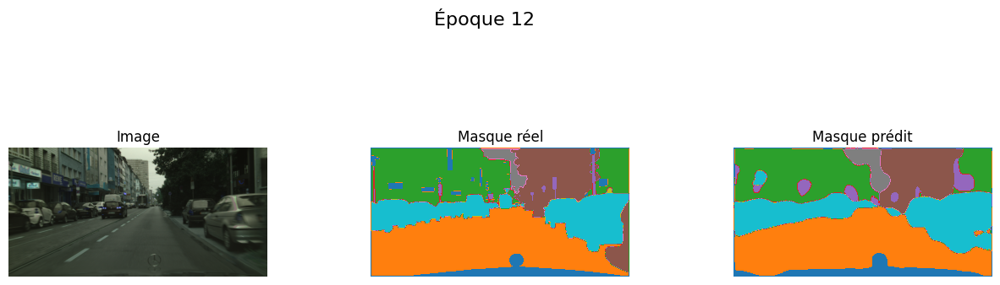

20/20 ━━━━━━━━━━━━━━━━━━━━ 1555s 79s/step - accuracy: 0.7984 - dice_coeff: 0.7222 - dice_loss: 0.2778 - jaccard_score: 0.5664 - loss: 0.0267 - total_loss: 0.5243 - val_accuracy: 0.8087 - val_dice_coeff: 0.7432 - val_dice_loss: 0.2568 - val_jaccard_score: 0.5921 - val_loss: 0.0303 - val_total_loss: 0.5437
Epoch 13/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.8396 - dice_coeff: 0.7764 - dice_loss: 0.2236 - jaccard_score: 0.6357 - loss: 0.0214 - total_loss: 0.5239 
Epoch 13: val_jaccard_score did not improve from 0.59212
1/1 ━━━━━━━━━━━━━━━━━━━━ 628s 628s/step


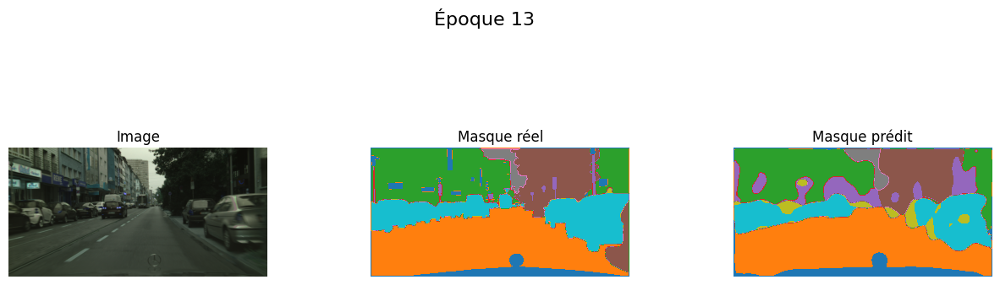

20/20 ━━━━━━━━━━━━━━━━━━━━ 1540s 78s/step - accuracy: 0.8393 - dice_coeff: 0.7761 - dice_loss: 0.2239 - jaccard_score: 0.6354 - loss: 0.0214 - total_loss: 0.5238 - val_accuracy: 0.7620 - val_dice_coeff: 0.6858 - val_dice_loss: 0.3142 - val_jaccard_score: 0.5226 - val_loss: 0.0320 - val_total_loss: 0.5452
Epoch 14/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.8345 - dice_coeff: 0.7665 - dice_loss: 0.2335 - jaccard_score: 0.6226 - loss: 0.0216 - total_loss: 0.5105 
Epoch 14: val_jaccard_score did not improve from 0.59212
1/1 ━━━━━━━━━━━━━━━━━━━━ 673s 673s/step


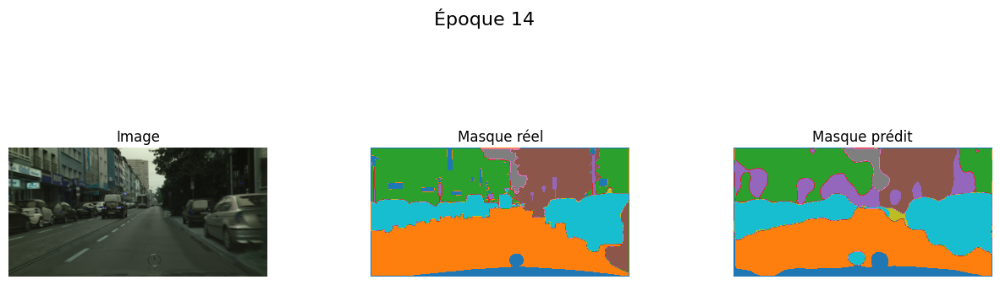

20/20 ━━━━━━━━━━━━━━━━━━━━ 1539s 79s/step - accuracy: 0.8347 - dice_coeff: 0.7668 - dice_loss: 0.2332 - jaccard_score: 0.6231 - loss: 0.0215 - total_loss: 0.5107 - val_accuracy: 0.7150 - val_dice_coeff: 0.6638 - val_dice_loss: 0.3362 - val_jaccard_score: 0.4976 - val_loss: 0.0309 - val_total_loss: 0.5957
Epoch 15/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.8350 - dice_coeff: 0.7802 - dice_loss: 0.2198 - jaccard_score: 0.6403 - loss: 0.0208 - total_loss: 0.5284 
Epoch 15: val_jaccard_score did not improve from 0.59212
1/1 ━━━━━━━━━━━━━━━━━━━━ 633s 633s/step


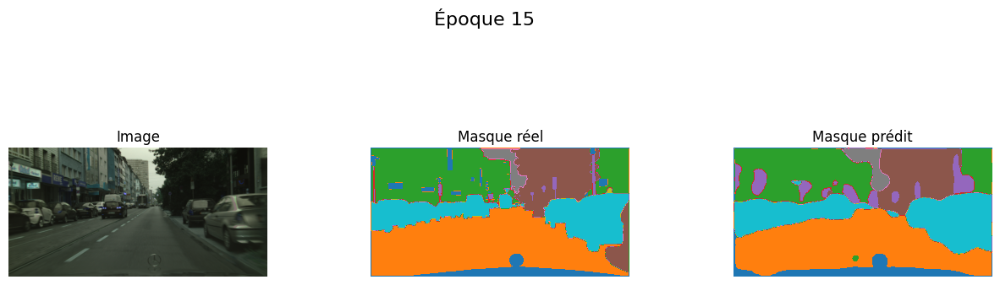

20/20 ━━━━━━━━━━━━━━━━━━━━ 1545s 79s/step - accuracy: 0.8356 - dice_coeff: 0.7807 - dice_loss: 0.2193 - jaccard_score: 0.6409 - loss: 0.0207 - total_loss: 0.5282 - val_accuracy: 0.7805 - val_dice_coeff: 0.7164 - val_dice_loss: 0.2836 - val_jaccard_score: 0.5594 - val_loss: 0.0284 - val_total_loss: 0.5398
Epoch 16/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.8539 - dice_coeff: 0.7934 - dice_loss: 0.2066 - jaccard_score: 0.6582 - loss: 0.0180 - total_loss: 0.5028 
Epoch 16: val_jaccard_score improved from 0.59212 to 0.60199, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 667s 667s/step


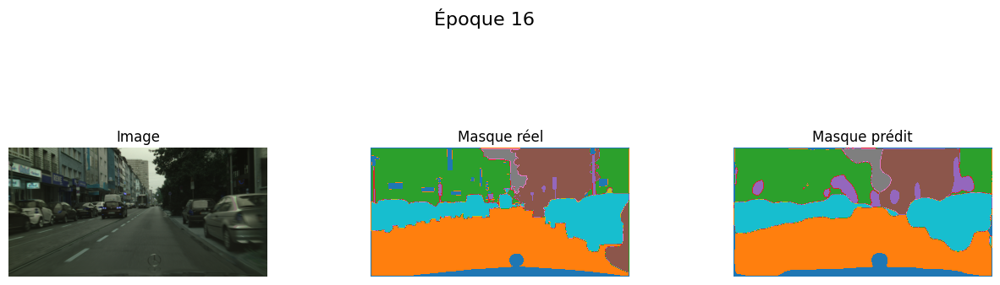

20/20 ━━━━━━━━━━━━━━━━━━━━ 1518s 78s/step - accuracy: 0.8540 - dice_coeff: 0.7936 - dice_loss: 0.2064 - jaccard_score: 0.6586 - loss: 0.0180 - total_loss: 0.5030 - val_accuracy: 0.8093 - val_dice_coeff: 0.7508 - val_dice_loss: 0.2492 - val_jaccard_score: 0.6020 - val_loss: 0.0276 - val_total_loss: 0.5630
Epoch 17/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 50s/step - accuracy: 0.8693 - dice_coeff: 0.8206 - dice_loss: 0.1794 - jaccard_score: 0.6965 - loss: 0.0162 - total_loss: 0.5185 
Epoch 17: val_jaccard_score improved from 0.60199 to 0.63353, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 653s 653s/step


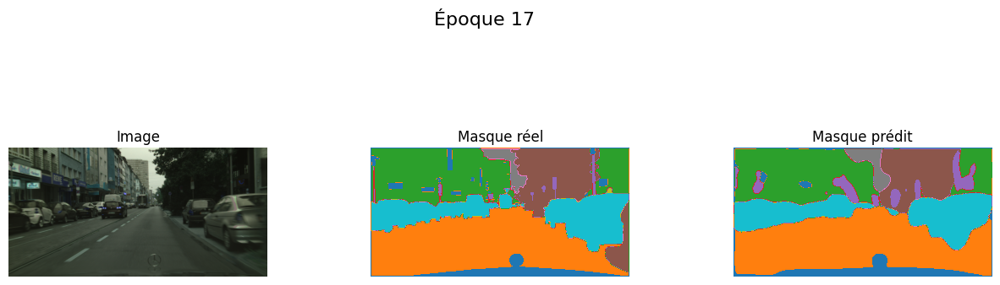

20/20 ━━━━━━━━━━━━━━━━━━━━ 1705s 87s/step - accuracy: 0.8694 - dice_coeff: 0.8208 - dice_loss: 0.1792 - jaccard_score: 0.6968 - loss: 0.0162 - total_loss: 0.5186 - val_accuracy: 0.8202 - val_dice_coeff: 0.7752 - val_dice_loss: 0.2248 - val_jaccard_score: 0.6335 - val_loss: 0.0295 - val_total_loss: 0.5926
Epoch 18/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.8787 - dice_coeff: 0.8293 - dice_loss: 0.1707 - jaccard_score: 0.7090 - loss: 0.0146 - total_loss: 0.5465 
Epoch 18: val_jaccard_score improved from 0.63353 to 0.63747, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 736s 736s/step


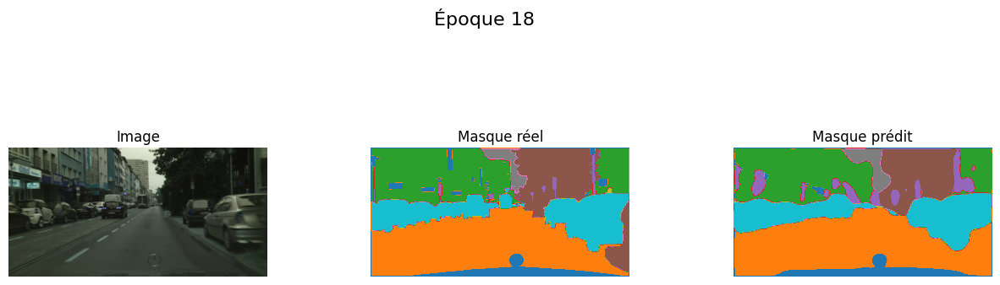

20/20 ━━━━━━━━━━━━━━━━━━━━ 1755s 90s/step - accuracy: 0.8787 - dice_coeff: 0.8294 - dice_loss: 0.1706 - jaccard_score: 0.7092 - loss: 0.0146 - total_loss: 0.5458 - val_accuracy: 0.8251 - val_dice_coeff: 0.7783 - val_dice_loss: 0.2217 - val_jaccard_score: 0.6375 - val_loss: 0.0269 - val_total_loss: 0.5548
Epoch 19/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.8889 - dice_coeff: 0.8460 - dice_loss: 0.1540 - jaccard_score: 0.7334 - loss: 0.0141 - total_loss: 0.5177 
Epoch 19: val_jaccard_score did not improve from 0.63747
1/1 ━━━━━━━━━━━━━━━━━━━━ 719s 719s/step


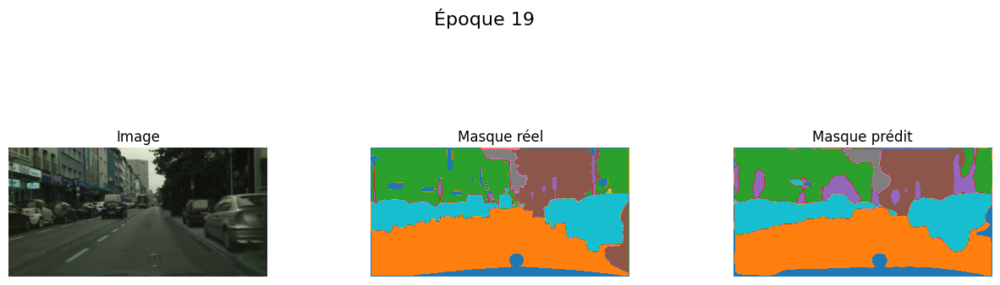

20/20 ━━━━━━━━━━━━━━━━━━━━ 1753s 89s/step - accuracy: 0.8890 - dice_coeff: 0.8461 - dice_loss: 0.1539 - jaccard_score: 0.7336 - loss: 0.0141 - total_loss: 0.5177 - val_accuracy: 0.7988 - val_dice_coeff: 0.7642 - val_dice_loss: 0.2358 - val_jaccard_score: 0.6190 - val_loss: 0.0278 - val_total_loss: 0.5897
Epoch 20/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 50s/step - accuracy: 0.8927 - dice_coeff: 0.8548 - dice_loss: 0.1452 - jaccard_score: 0.7468 - loss: 0.0129 - total_loss: 0.5239 
Epoch 20: val_jaccard_score improved from 0.63747 to 0.67075, saving model to best_model_albumentations_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 726s 726s/step


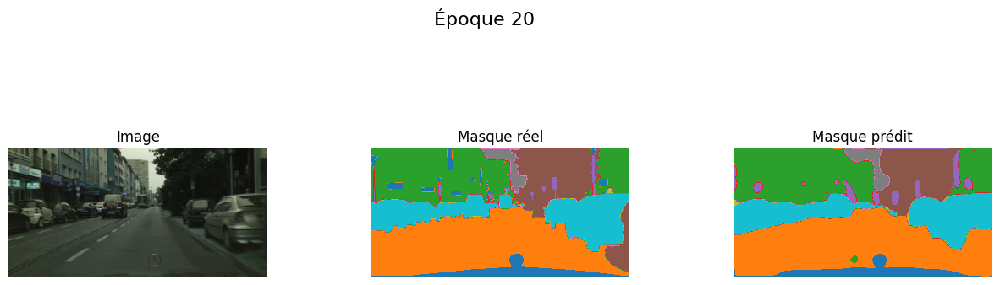

20/20 ━━━━━━━━━━━━━━━━━━━━ 1768s 91s/step - accuracy: 0.8926 - dice_coeff: 0.8548 - dice_loss: 0.1452 - jaccard_score: 0.7467 - loss: 0.0130 - total_loss: 0.5239 - val_accuracy: 0.8354 - val_dice_coeff: 0.8026 - val_dice_loss: 0.1974 - val_jaccard_score: 0.6707 - val_loss: 0.0305 - val_total_loss: 0.5362
Restoring model weights from the end of the best epoch: 20.


In [152]:
# Entraînement du modèle avec les données augmentées
history = model_albu_simple.fit(
    images_aug,
    masks_aug,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(model_albu_simple)]
)

#### Data augmentation étendue

In [28]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [29]:
filename = f"best_model_albumentations_2.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [30]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [31]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

Poids des classes :
Classe 0: 0.0569
Classe 1: 0.0145
Classe 2: 0.0264
Classe 3: 0.3206
Classe 4: 0.0377
Classe 5: 0.1541
Classe 6: 0.3085
Classe 7: 0.0813


In [32]:
# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(512, 1024, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
x = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model_albu_etendu = Model(inputs=base_model.input, outputs=x)

# Compilation du modèle
model_albu_etendu.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

In [33]:
# Utilisation de la fonction d'augmentation avec transformations supplémentaires avec albumentations
images_aug, masks_aug = augment_data_albumentations_extended(df_train_sample)

print("Shape des images :", images_aug.shape)  # (N, 512, 1024, 3)
print("Shape des masques :", masks_aug.shape)  # (N, 512, 1024, nombre_de_classes)

Shape des images : (100, 512, 1024, 3)
Shape des masques : (100, 512, 1024, 8)


Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.1682 - dice_coeff: 0.1385 - dice_loss: 0.8615 - jaccard_score: 0.0747 - loss: 0.0929 - total_loss: 0.7869 
Epoch 1: val_jaccard_score improved from -inf to 0.08389, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 658s 658s/step


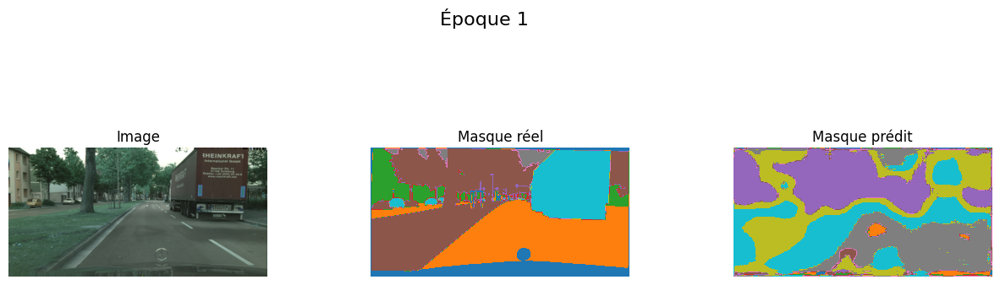

20/20 ━━━━━━━━━━━━━━━━━━━━ 1510s 77s/step - accuracy: 0.1730 - dice_coeff: 0.1401 - dice_loss: 0.8599 - jaccard_score: 0.0757 - loss: 0.0927 - total_loss: 0.7859 - val_accuracy: 0.1762 - val_dice_coeff: 0.1547 - val_dice_loss: 0.8453 - val_jaccard_score: 0.0839 - val_loss: 0.0805 - val_total_loss: 0.8380
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.3280 - dice_coeff: 0.2351 - dice_loss: 0.7649 - jaccard_score: 0.1350 - loss: 0.0846 - total_loss: 0.7614 
Epoch 2: val_jaccard_score improved from 0.08389 to 0.19446, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 661s 661s/step


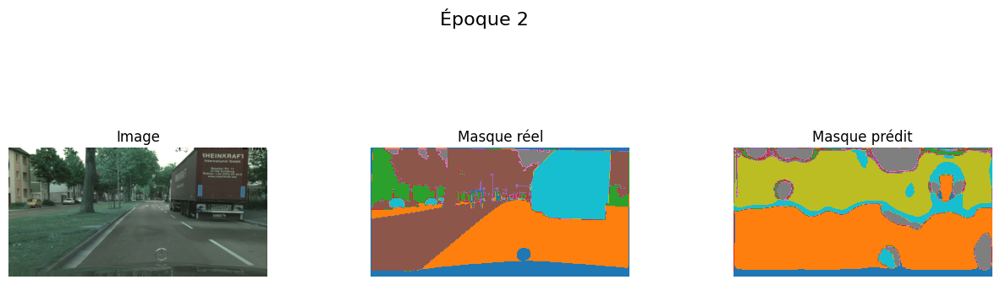

20/20 ━━━━━━━━━━━━━━━━━━━━ 1558s 80s/step - accuracy: 0.3311 - dice_coeff: 0.2374 - dice_loss: 0.7626 - jaccard_score: 0.1365 - loss: 0.0842 - total_loss: 0.7598 - val_accuracy: 0.4179 - val_dice_coeff: 0.3254 - val_dice_loss: 0.6746 - val_jaccard_score: 0.1945 - val_loss: 0.0647 - val_total_loss: 0.7465
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.4756 - dice_coeff: 0.3661 - dice_loss: 0.6339 - jaccard_score: 0.2259 - loss: 0.0662 - total_loss: 0.7262 
Epoch 3: val_jaccard_score improved from 0.19446 to 0.21817, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 626s 626s/step


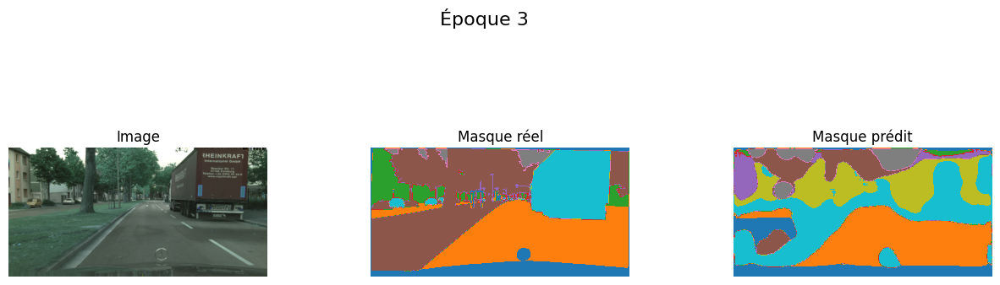

20/20 ━━━━━━━━━━━━━━━━━━━━ 1528s 78s/step - accuracy: 0.4781 - dice_coeff: 0.3684 - dice_loss: 0.6316 - jaccard_score: 0.2277 - loss: 0.0661 - total_loss: 0.7254 - val_accuracy: 0.4536 - val_dice_coeff: 0.3578 - val_dice_loss: 0.6422 - val_jaccard_score: 0.2182 - val_loss: 0.0592 - val_total_loss: 0.7276
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.4998 - dice_coeff: 0.3800 - dice_loss: 0.6200 - jaccard_score: 0.2382 - loss: 0.0619 - total_loss: 0.7109 
Epoch 4: val_jaccard_score improved from 0.21817 to 0.29778, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 650s 650s/step


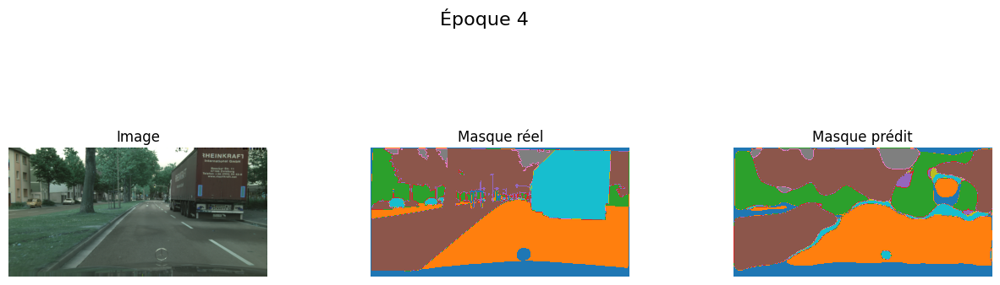

20/20 ━━━━━━━━━━━━━━━━━━━━ 1517s 78s/step - accuracy: 0.5016 - dice_coeff: 0.3814 - dice_loss: 0.6186 - jaccard_score: 0.2392 - loss: 0.0619 - total_loss: 0.7105 - val_accuracy: 0.6505 - val_dice_coeff: 0.4578 - val_dice_loss: 0.5422 - val_jaccard_score: 0.2978 - val_loss: 0.0688 - val_total_loss: 0.6608
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.6043 - dice_coeff: 0.4500 - dice_loss: 0.5500 - jaccard_score: 0.2928 - loss: 0.0651 - total_loss: 0.6569 
Epoch 5: val_jaccard_score did not improve from 0.29778
1/1 ━━━━━━━━━━━━━━━━━━━━ 633s 633s/step


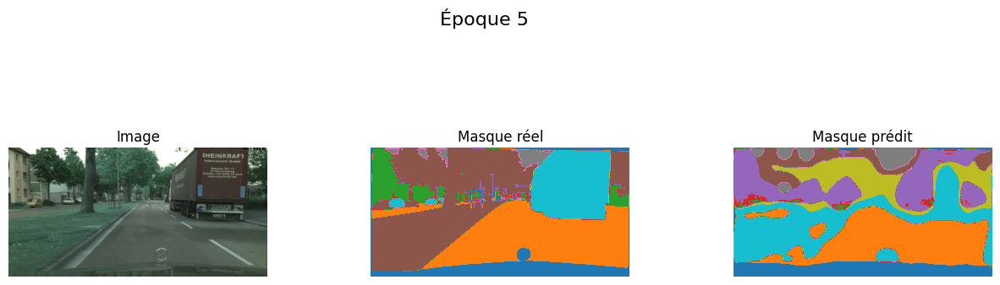

20/20 ━━━━━━━━━━━━━━━━━━━━ 1538s 79s/step - accuracy: 0.6015 - dice_coeff: 0.4489 - dice_loss: 0.5511 - jaccard_score: 0.2919 - loss: 0.0650 - total_loss: 0.6582 - val_accuracy: 0.4552 - val_dice_coeff: 0.3820 - val_dice_loss: 0.6180 - val_jaccard_score: 0.2365 - val_loss: 0.0547 - val_total_loss: 0.7343
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.6110 - dice_coeff: 0.4627 - dice_loss: 0.5373 - jaccard_score: 0.3020 - loss: 0.0530 - total_loss: 0.6899 
Epoch 6: val_jaccard_score improved from 0.29778 to 0.32994, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 733s 733s/step


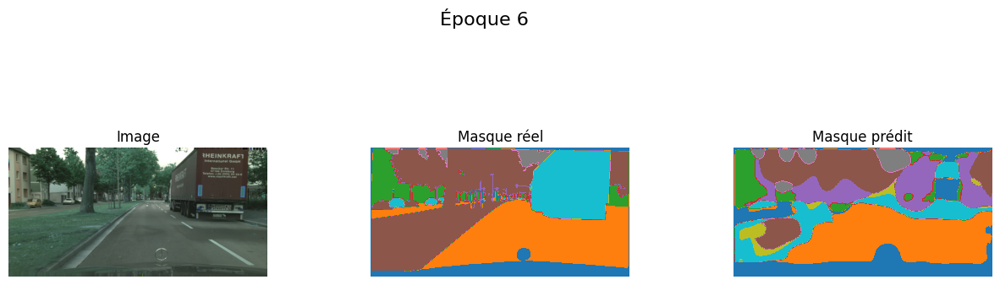

20/20 ━━━━━━━━━━━━━━━━━━━━ 1620s 83s/step - accuracy: 0.6115 - dice_coeff: 0.4632 - dice_loss: 0.5368 - jaccard_score: 0.3025 - loss: 0.0531 - total_loss: 0.6895 - val_accuracy: 0.5768 - val_dice_coeff: 0.4957 - val_dice_loss: 0.5043 - val_jaccard_score: 0.3299 - val_loss: 0.0471 - val_total_loss: 0.6889
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.6540 - dice_coeff: 0.5517 - dice_loss: 0.4483 - jaccard_score: 0.3843 - loss: 0.0467 - total_loss: 0.6565 
Epoch 7: val_jaccard_score did not improve from 0.32994
1/1 ━━━━━━━━━━━━━━━━━━━━ 696s 696s/step


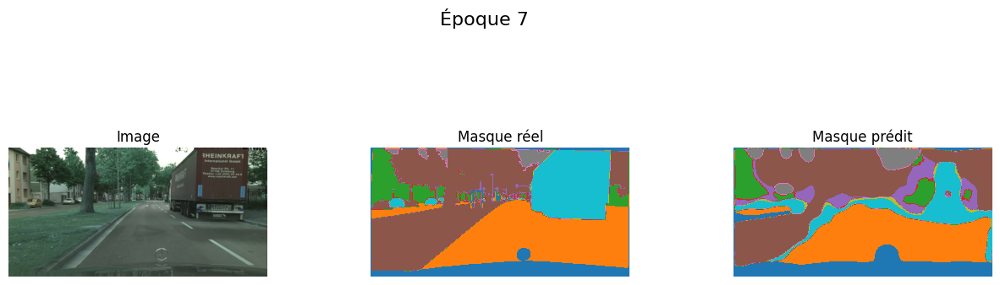

20/20 ━━━━━━━━━━━━━━━━━━━━ 1736s 88s/step - accuracy: 0.6526 - dice_coeff: 0.5503 - dice_loss: 0.4497 - jaccard_score: 0.3830 - loss: 0.0469 - total_loss: 0.6569 - val_accuracy: 0.6153 - val_dice_coeff: 0.4818 - val_dice_loss: 0.5182 - val_jaccard_score: 0.3183 - val_loss: 0.0504 - val_total_loss: 0.6615
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 45s/step - accuracy: 0.6692 - dice_coeff: 0.5340 - dice_loss: 0.4660 - jaccard_score: 0.3659 - loss: 0.0505 - total_loss: 0.6391 
Epoch 8: val_jaccard_score improved from 0.32994 to 0.33571, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 644s 644s/step


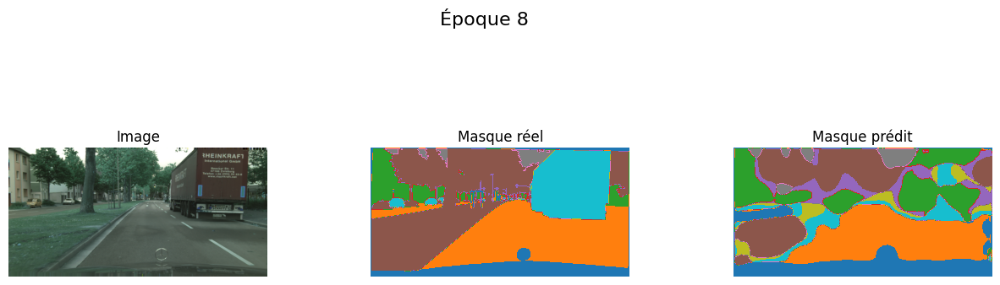

20/20 ━━━━━━━━━━━━━━━━━━━━ 1584s 81s/step - accuracy: 0.6700 - dice_coeff: 0.5347 - dice_loss: 0.4653 - jaccard_score: 0.3665 - loss: 0.0504 - total_loss: 0.6389 - val_accuracy: 0.6324 - val_dice_coeff: 0.5020 - val_dice_loss: 0.4980 - val_jaccard_score: 0.3357 - val_loss: 0.0465 - val_total_loss: 0.7075
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.7042 - dice_coeff: 0.5873 - dice_loss: 0.4127 - jaccard_score: 0.4169 - loss: 0.0414 - total_loss: 0.6625 
Epoch 9: val_jaccard_score improved from 0.33571 to 0.42177, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 624s 624s/step


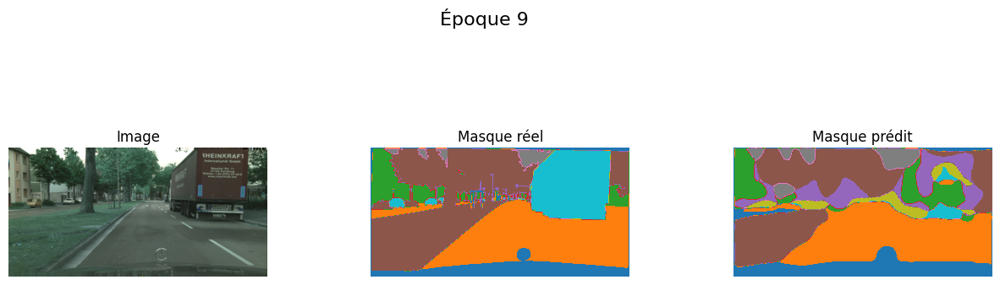

20/20 ━━━━━━━━━━━━━━━━━━━━ 1512s 77s/step - accuracy: 0.7049 - dice_coeff: 0.5881 - dice_loss: 0.4119 - jaccard_score: 0.4177 - loss: 0.0413 - total_loss: 0.6619 - val_accuracy: 0.6640 - val_dice_coeff: 0.5927 - val_dice_loss: 0.4073 - val_jaccard_score: 0.4218 - val_loss: 0.0427 - val_total_loss: 0.6262
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.7218 - dice_coeff: 0.6338 - dice_loss: 0.3662 - jaccard_score: 0.4655 - loss: 0.0370 - total_loss: 0.5999 
Epoch 10: val_jaccard_score did not improve from 0.42177
1/1 ━━━━━━━━━━━━━━━━━━━━ 648s 648s/step


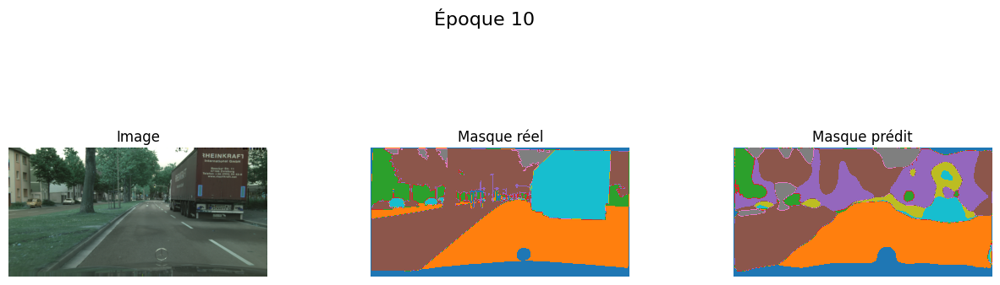

20/20 ━━━━━━━━━━━━━━━━━━━━ 1502s 77s/step - accuracy: 0.7213 - dice_coeff: 0.6328 - dice_loss: 0.3672 - jaccard_score: 0.4644 - loss: 0.0371 - total_loss: 0.6002 - val_accuracy: 0.6227 - val_dice_coeff: 0.5358 - val_dice_loss: 0.4642 - val_jaccard_score: 0.3666 - val_loss: 0.0430 - val_total_loss: 0.6645
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.7114 - dice_coeff: 0.6132 - dice_loss: 0.3868 - jaccard_score: 0.4438 - loss: 0.0398 - total_loss: 0.6086 
Epoch 11: val_jaccard_score did not improve from 0.42177
1/1 ━━━━━━━━━━━━━━━━━━━━ 625s 625s/step


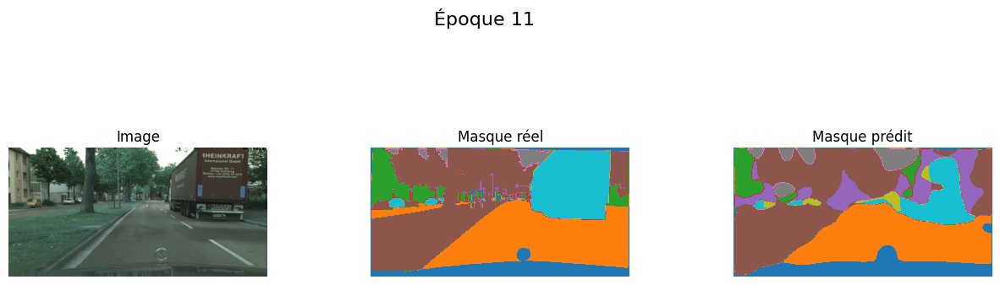

20/20 ━━━━━━━━━━━━━━━━━━━━ 1502s 77s/step - accuracy: 0.7123 - dice_coeff: 0.6138 - dice_loss: 0.3862 - jaccard_score: 0.4444 - loss: 0.0397 - total_loss: 0.6079 - val_accuracy: 0.6417 - val_dice_coeff: 0.5622 - val_dice_loss: 0.4378 - val_jaccard_score: 0.3920 - val_loss: 0.0385 - val_total_loss: 0.6621
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.7152 - dice_coeff: 0.6229 - dice_loss: 0.3771 - jaccard_score: 0.4539 - loss: 0.0351 - total_loss: 0.6158 
Epoch 12: val_jaccard_score improved from 0.42177 to 0.43046, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 651s 651s/step


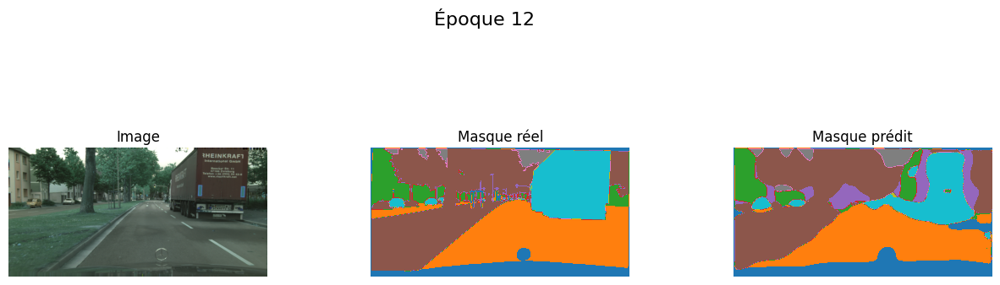

20/20 ━━━━━━━━━━━━━━━━━━━━ 1497s 77s/step - accuracy: 0.7161 - dice_coeff: 0.6240 - dice_loss: 0.3760 - jaccard_score: 0.4551 - loss: 0.0351 - total_loss: 0.6149 - val_accuracy: 0.6999 - val_dice_coeff: 0.6011 - val_dice_loss: 0.3989 - val_jaccard_score: 0.4305 - val_loss: 0.0376 - val_total_loss: 0.6238
Epoch 13/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.7726 - dice_coeff: 0.6746 - dice_loss: 0.3254 - jaccard_score: 0.5101 - loss: 0.0290 - total_loss: 0.5717 
Epoch 13: val_jaccard_score improved from 0.43046 to 0.45268, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 644s 644s/step


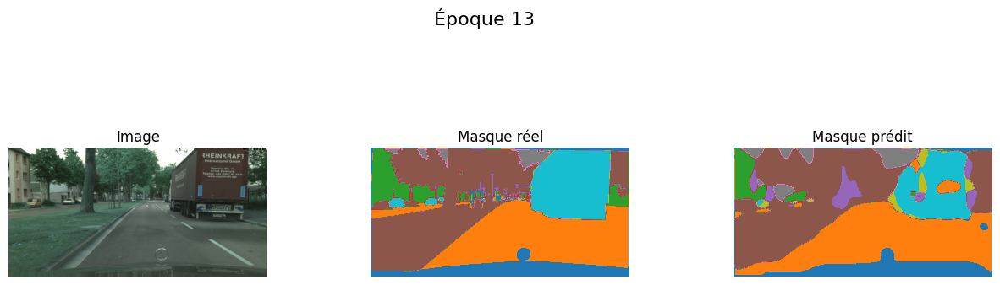

20/20 ━━━━━━━━━━━━━━━━━━━━ 1535s 78s/step - accuracy: 0.7722 - dice_coeff: 0.6744 - dice_loss: 0.3256 - jaccard_score: 0.5100 - loss: 0.0290 - total_loss: 0.5723 - val_accuracy: 0.7169 - val_dice_coeff: 0.6228 - val_dice_loss: 0.3772 - val_jaccard_score: 0.4527 - val_loss: 0.0361 - val_total_loss: 0.5892
Epoch 14/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.7736 - dice_coeff: 0.6788 - dice_loss: 0.3212 - jaccard_score: 0.5147 - loss: 0.0302 - total_loss: 0.5623 
Epoch 14: val_jaccard_score improved from 0.45268 to 0.48862, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 635s 635s/step


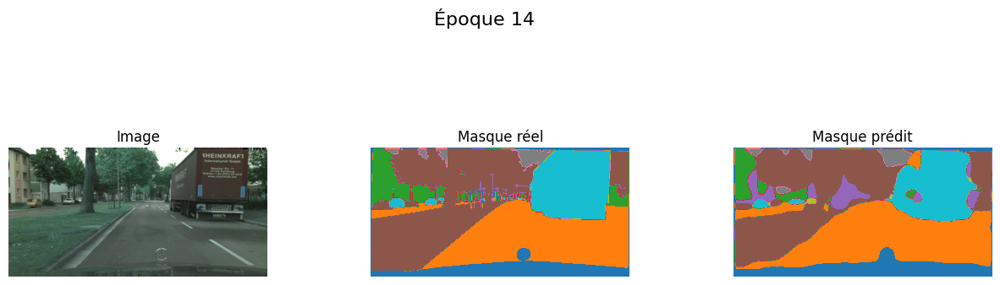

20/20 ━━━━━━━━━━━━━━━━━━━━ 1462s 75s/step - accuracy: 0.7739 - dice_coeff: 0.6794 - dice_loss: 0.3206 - jaccard_score: 0.5155 - loss: 0.0301 - total_loss: 0.5622 - val_accuracy: 0.7340 - val_dice_coeff: 0.6563 - val_dice_loss: 0.3437 - val_jaccard_score: 0.4886 - val_loss: 0.0344 - val_total_loss: 0.5952
Epoch 15/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.8239 - dice_coeff: 0.7400 - dice_loss: 0.2600 - jaccard_score: 0.5879 - loss: 0.0241 - total_loss: 0.5275 
Epoch 15: val_jaccard_score improved from 0.48862 to 0.51298, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 653s 653s/step


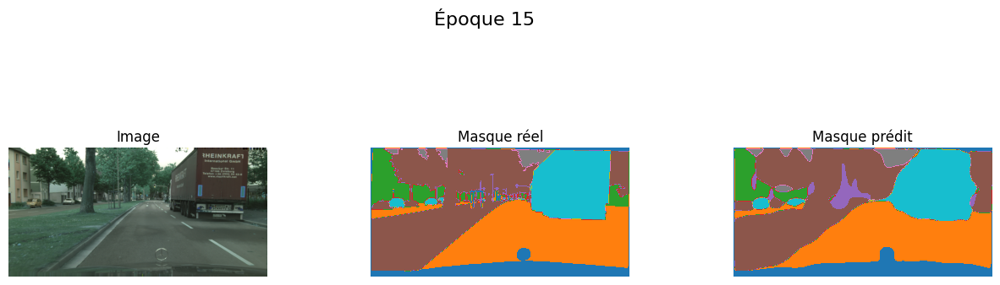

20/20 ━━━━━━━━━━━━━━━━━━━━ 1543s 79s/step - accuracy: 0.8232 - dice_coeff: 0.7398 - dice_loss: 0.2602 - jaccard_score: 0.5877 - loss: 0.0241 - total_loss: 0.5282 - val_accuracy: 0.7491 - val_dice_coeff: 0.6777 - val_dice_loss: 0.3223 - val_jaccard_score: 0.5130 - val_loss: 0.0324 - val_total_loss: 0.5872
Epoch 16/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.8260 - dice_coeff: 0.7525 - dice_loss: 0.2475 - jaccard_score: 0.6039 - loss: 0.0230 - total_loss: 0.5425 
Epoch 16: val_jaccard_score improved from 0.51298 to 0.53334, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 633s 633s/step


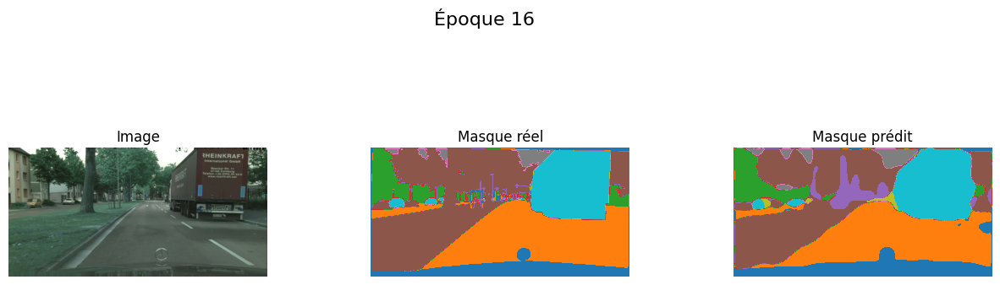

20/20 ━━━━━━━━━━━━━━━━━━━━ 1472s 75s/step - accuracy: 0.8258 - dice_coeff: 0.7525 - dice_loss: 0.2475 - jaccard_score: 0.6039 - loss: 0.0230 - total_loss: 0.5428 - val_accuracy: 0.7617 - val_dice_coeff: 0.6954 - val_dice_loss: 0.3046 - val_jaccard_score: 0.5333 - val_loss: 0.0320 - val_total_loss: 0.5947
Epoch 17/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.8381 - dice_coeff: 0.7730 - dice_loss: 0.2270 - jaccard_score: 0.6305 - loss: 0.0202 - total_loss: 0.5344 
Epoch 17: val_jaccard_score did not improve from 0.53334
1/1 ━━━━━━━━━━━━━━━━━━━━ 655s 655s/step


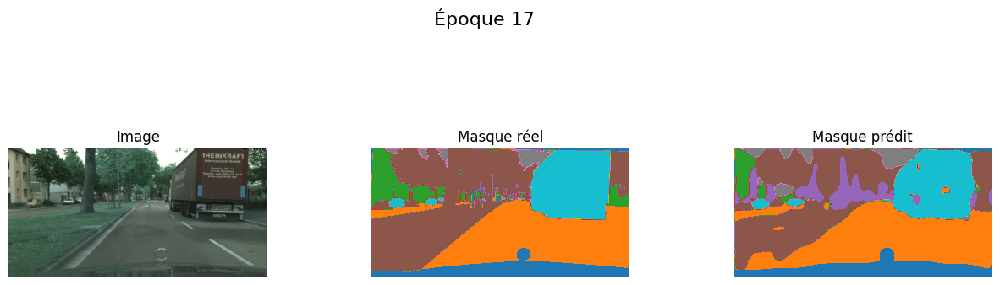

20/20 ━━━━━━━━━━━━━━━━━━━━ 1539s 79s/step - accuracy: 0.8382 - dice_coeff: 0.7734 - dice_loss: 0.2266 - jaccard_score: 0.6310 - loss: 0.0202 - total_loss: 0.5341 - val_accuracy: 0.7267 - val_dice_coeff: 0.6858 - val_dice_loss: 0.3142 - val_jaccard_score: 0.5220 - val_loss: 0.0333 - val_total_loss: 0.6001
Epoch 18/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40s/step - accuracy: 0.8146 - dice_coeff: 0.7566 - dice_loss: 0.2434 - jaccard_score: 0.6110 - loss: 0.0216 - total_loss: 0.5525 
Epoch 18: val_jaccard_score did not improve from 0.53334
1/1 ━━━━━━━━━━━━━━━━━━━━ 745s 745s/step


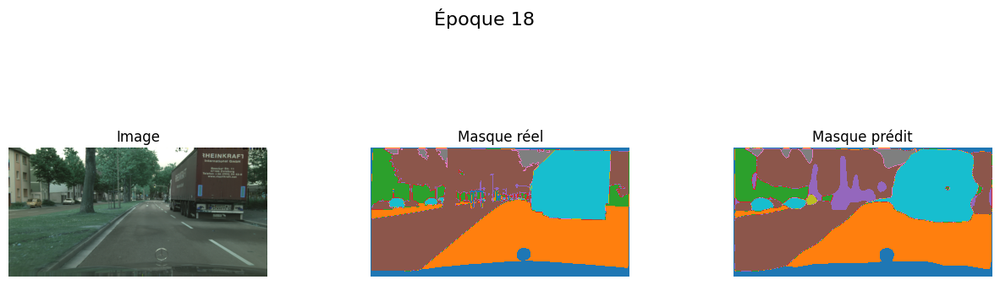

20/20 ━━━━━━━━━━━━━━━━━━━━ 1584s 81s/step - accuracy: 0.8157 - dice_coeff: 0.7574 - dice_loss: 0.2426 - jaccard_score: 0.6120 - loss: 0.0215 - total_loss: 0.5515 - val_accuracy: 0.7422 - val_dice_coeff: 0.6814 - val_dice_loss: 0.3186 - val_jaccard_score: 0.5175 - val_loss: 0.0377 - val_total_loss: 0.6363
Epoch 19/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 44s/step - accuracy: 0.8461 - dice_coeff: 0.7890 - dice_loss: 0.2110 - jaccard_score: 0.6531 - loss: 0.0189 - total_loss: 0.5295 
Epoch 19: val_jaccard_score did not improve from 0.53334
1/1 ━━━━━━━━━━━━━━━━━━━━ 630s 630s/step


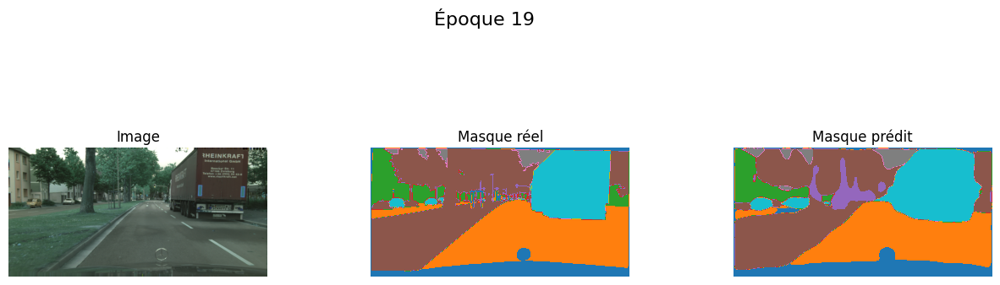

20/20 ━━━━━━━━━━━━━━━━━━━━ 1591s 79s/step - accuracy: 0.8464 - dice_coeff: 0.7894 - dice_loss: 0.2106 - jaccard_score: 0.6537 - loss: 0.0189 - total_loss: 0.5294 - val_accuracy: 0.7357 - val_dice_coeff: 0.6833 - val_dice_loss: 0.3167 - val_jaccard_score: 0.5194 - val_loss: 0.0381 - val_total_loss: 0.6692
Epoch 20/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.8501 - dice_coeff: 0.7948 - dice_loss: 0.2052 - jaccard_score: 0.6606 - loss: 0.0182 - total_loss: 0.5431 
Epoch 20: val_jaccard_score improved from 0.53334 to 0.58404, saving model to best_model_albumentations_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 649s 649s/step


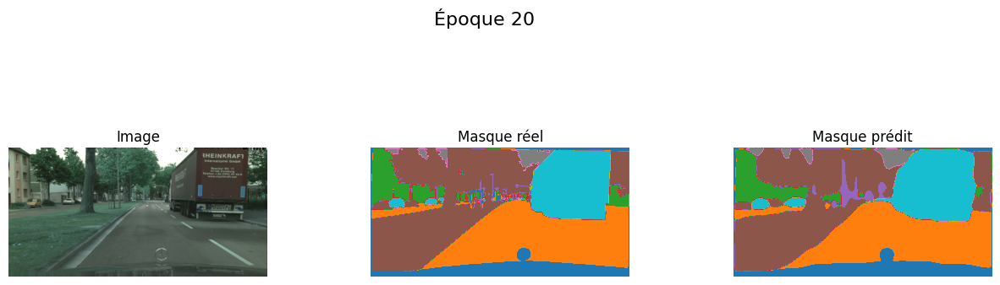

20/20 ━━━━━━━━━━━━━━━━━━━━ 1516s 78s/step - accuracy: 0.8505 - dice_coeff: 0.7953 - dice_loss: 0.2047 - jaccard_score: 0.6613 - loss: 0.0182 - total_loss: 0.5424 - val_accuracy: 0.7938 - val_dice_coeff: 0.7372 - val_dice_loss: 0.2628 - val_jaccard_score: 0.5840 - val_loss: 0.0313 - val_total_loss: 0.5800
Restoring model weights from the end of the best epoch: 20.


In [34]:
# Entraînement du modèle avec les données augmentées
history = model_albu_etendu.fit(
    images_aug,
    masks_aug,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(model_albu_etendu)]
)

## Avec TensorFlow

### Fonctions

In [216]:
# Fonction pour effectuer une rotation sans tensorflow-addons
def rotate_image_and_mask(image, mask, angle):
    # Calculer k, le nombre de rotations de 90 degrés à effectuer
    k = angle // 90
    image = tf.image.rot90(image, k=k)
    mask = tf.image.rot90(mask, k=k)
    return image, mask

In [217]:
# Fonction de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(512 * scale), int(1024 * scale)))
        mask = tf.image.resize(mask, (int(512 * scale), int(1024 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (512, 1024))
        mask = tf.image.resize(mask, (512, 1024))
        
        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

In [218]:
# Fonction avancée de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf_extended(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(512 * scale), int(1024 * scale)))
        mask = tf.image.resize(mask, (int(512 * scale), int(1024 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (512, 1024))
        mask = tf.image.resize(mask, (512, 1024))

        # Ajout de transformations supplémentaires

        # Ajuste la luminosité
        image = tf.image.random_brightness(image, max_delta=0.2)  # delta de luminosité max de 20%

        # Ajuste le contraste
        image = tf.image.random_contrast(image, lower=0.8, upper=1.2)  # Contraste entre 80% et 120%

        # Ajuste la saturation (pour les images en couleur)
        image = tf.image.random_saturation(image, lower=0.8, upper=1.2)  # Saturation entre 80% et 120%

        # Ajuste la teinte
        image = tf.image.random_hue(image, max_delta=0.1)  # Variation de teinte max de 10%

        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

### Entraînement du modèle

In [219]:
# Chargement des images et masques
images = load_images(df_train_sample)
masks = load_masks(df_train_sample)

#### Data augmentation simple

In [220]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [221]:
filename = f"best_model_tensorflow_1.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [222]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [ ]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

In [223]:
# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(512, 1024, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
x = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model_tf_simple = Model(inputs=base_model.input, outputs=x)

# Compilation du modèle
model_tf_simple.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

In [224]:
# Appliquer la data augmentation
images_aug, masks_aug = augment_data_tf(images, masks)

print("Shape des images :", images_aug.shape)  # (N, 512, 1024, 3)
print("Shape des masques :", masks_aug.shape)  # (N, 512, 1024, nombre_de_classes)

Shape des images : (100, 512, 1024, 3)
Shape des masques : (100, 512, 1024, 8)


Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.0996 - dice_coeff: 0.1249 - dice_loss: 0.8751 - jaccard_score: 0.0666 - loss: 0.0973 - total_loss: 0.8013 
Epoch 1: val_jaccard_score improved from -inf to 0.07455, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 666s 666s/step


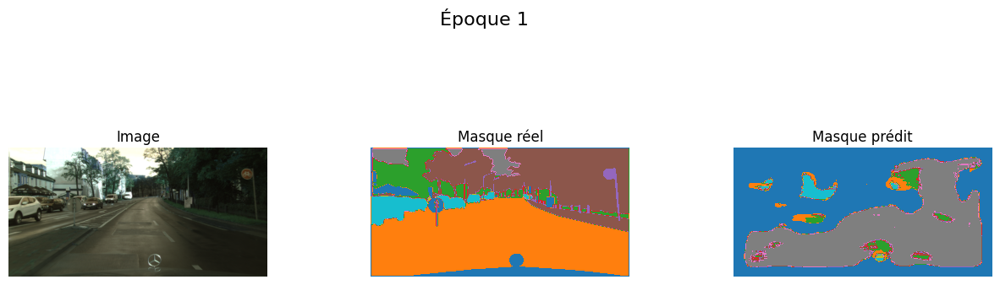

20/20 ━━━━━━━━━━━━━━━━━━━━ 1538s 78s/step - accuracy: 0.0994 - dice_coeff: 0.1250 - dice_loss: 0.8750 - jaccard_score: 0.0667 - loss: 0.0972 - total_loss: 0.8012 - val_accuracy: 0.1468 - val_dice_coeff: 0.1387 - val_dice_loss: 0.8613 - val_jaccard_score: 0.0745 - val_loss: 0.0904 - val_total_loss: 0.8302
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1493 - dice_coeff: 0.1385 - dice_loss: 0.8615 - jaccard_score: 0.0744 - loss: 0.0930 - total_loss: 0.8056 
Epoch 2: val_jaccard_score improved from 0.07455 to 0.07892, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 662s 662s/step


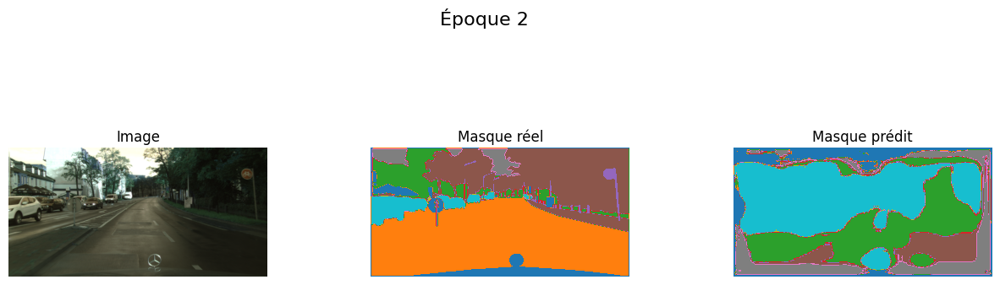

20/20 ━━━━━━━━━━━━━━━━━━━━ 1529s 79s/step - accuracy: 0.1493 - dice_coeff: 0.1386 - dice_loss: 0.8614 - jaccard_score: 0.0744 - loss: 0.0930 - total_loss: 0.8053 - val_accuracy: 0.1618 - val_dice_coeff: 0.1463 - val_dice_loss: 0.8537 - val_jaccard_score: 0.0789 - val_loss: 0.0838 - val_total_loss: 0.7986
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.1652 - dice_coeff: 0.1526 - dice_loss: 0.8474 - jaccard_score: 0.0826 - loss: 0.0861 - total_loss: 0.8079 
Epoch 3: val_jaccard_score improved from 0.07892 to 0.08202, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 672s 672s/step


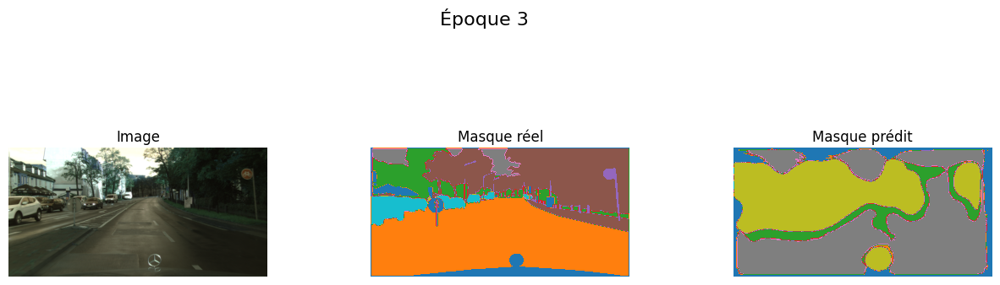

20/20 ━━━━━━━━━━━━━━━━━━━━ 1568s 80s/step - accuracy: 0.1644 - dice_coeff: 0.1526 - dice_loss: 0.8474 - jaccard_score: 0.0826 - loss: 0.0863 - total_loss: 0.8080 - val_accuracy: 0.1009 - val_dice_coeff: 0.1516 - val_dice_loss: 0.8484 - val_jaccard_score: 0.0820 - val_loss: 0.0829 - val_total_loss: 0.8165
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 44s/step - accuracy: 0.1349 - dice_coeff: 0.1523 - dice_loss: 0.8477 - jaccard_score: 0.0824 - loss: 0.0900 - total_loss: 0.8128 
Epoch 4: val_jaccard_score did not improve from 0.08202
1/1 ━━━━━━━━━━━━━━━━━━━━ 669s 669s/step


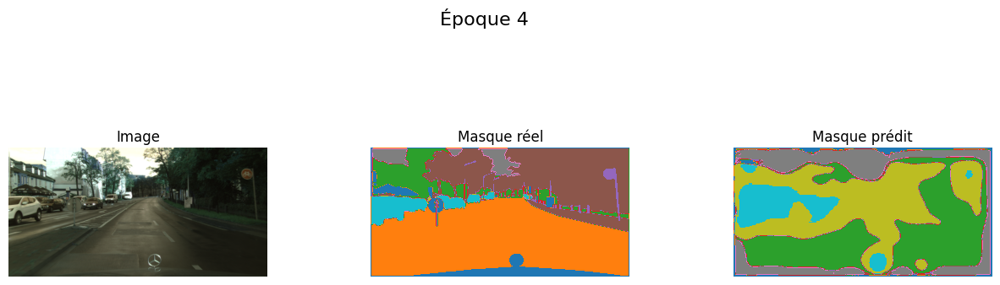

20/20 ━━━━━━━━━━━━━━━━━━━━ 1586s 82s/step - accuracy: 0.1351 - dice_coeff: 0.1523 - dice_loss: 0.8477 - jaccard_score: 0.0824 - loss: 0.0899 - total_loss: 0.8130 - val_accuracy: 0.1263 - val_dice_coeff: 0.1488 - val_dice_loss: 0.8512 - val_jaccard_score: 0.0804 - val_loss: 0.0840 - val_total_loss: 0.8317
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.1517 - dice_coeff: 0.1640 - dice_loss: 0.8360 - jaccard_score: 0.0894 - loss: 0.0825 - total_loss: 0.8253 
Epoch 5: val_jaccard_score improved from 0.08202 to 0.08390, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 655s 655s/step


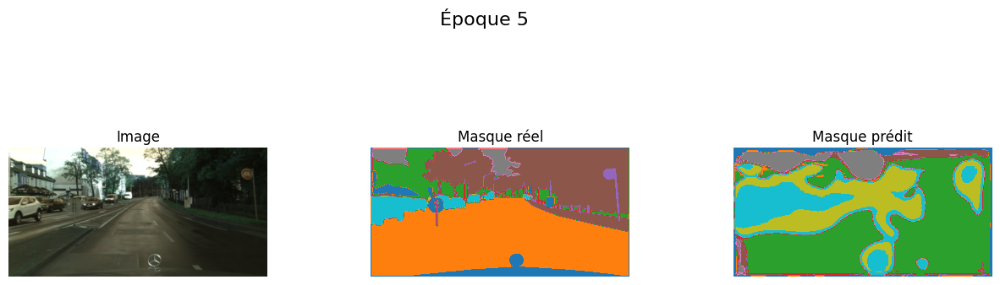

20/20 ━━━━━━━━━━━━━━━━━━━━ 1565s 80s/step - accuracy: 0.1523 - dice_coeff: 0.1642 - dice_loss: 0.8358 - jaccard_score: 0.0895 - loss: 0.0827 - total_loss: 0.8253 - val_accuracy: 0.1639 - val_dice_coeff: 0.1548 - val_dice_loss: 0.8452 - val_jaccard_score: 0.0839 - val_loss: 0.0838 - val_total_loss: 0.8225
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43s/step - accuracy: 0.1571 - dice_coeff: 0.1639 - dice_loss: 0.8361 - jaccard_score: 0.0893 - loss: 0.0847 - total_loss: 0.8169 
Epoch 6: val_jaccard_score improved from 0.08390 to 0.08786, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 660s 660s/step


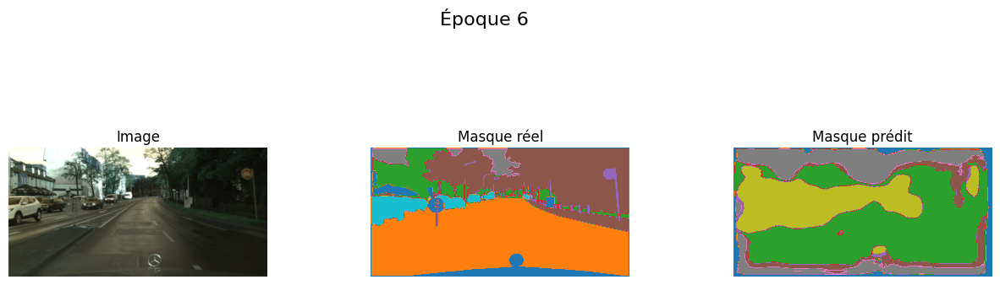

20/20 ━━━━━━━━━━━━━━━━━━━━ 1561s 80s/step - accuracy: 0.1574 - dice_coeff: 0.1639 - dice_loss: 0.8361 - jaccard_score: 0.0893 - loss: 0.0847 - total_loss: 0.8170 - val_accuracy: 0.1664 - val_dice_coeff: 0.1615 - val_dice_loss: 0.8385 - val_jaccard_score: 0.0879 - val_loss: 0.0814 - val_total_loss: 0.8177
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46s/step - accuracy: 0.1850 - dice_coeff: 0.1702 - dice_loss: 0.8298 - jaccard_score: 0.0931 - loss: 0.0809 - total_loss: 0.8152 
Epoch 7: val_jaccard_score improved from 0.08786 to 0.09336, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 666s 666s/step


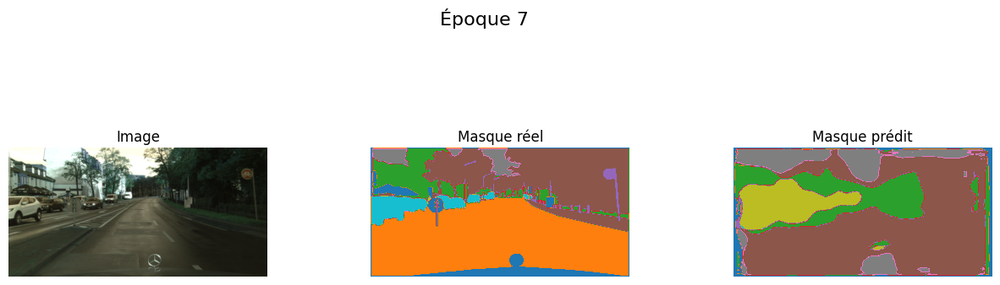

20/20 ━━━━━━━━━━━━━━━━━━━━ 1656s 84s/step - accuracy: 0.1853 - dice_coeff: 0.1704 - dice_loss: 0.8296 - jaccard_score: 0.0932 - loss: 0.0810 - total_loss: 0.8155 - val_accuracy: 0.1981 - val_dice_coeff: 0.1707 - val_dice_loss: 0.8293 - val_jaccard_score: 0.0934 - val_loss: 0.0813 - val_total_loss: 0.8202
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1899 - dice_coeff: 0.1742 - dice_loss: 0.8258 - jaccard_score: 0.0955 - loss: 0.0794 - total_loss: 0.8178 
Epoch 8: val_jaccard_score did not improve from 0.09336
1/1 ━━━━━━━━━━━━━━━━━━━━ 626s 626s/step


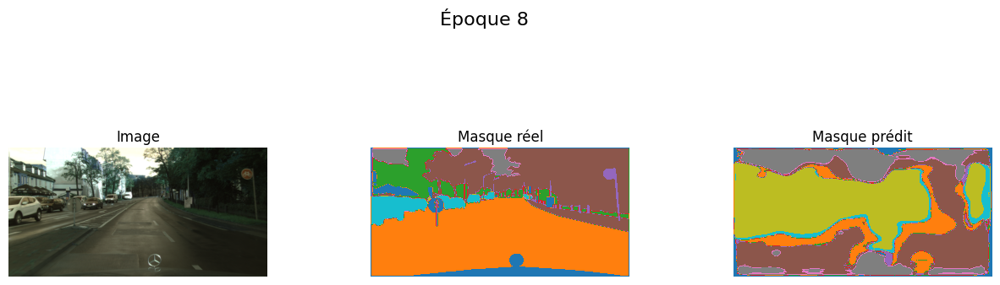

20/20 ━━━━━━━━━━━━━━━━━━━━ 1508s 77s/step - accuracy: 0.1899 - dice_coeff: 0.1742 - dice_loss: 0.8258 - jaccard_score: 0.0955 - loss: 0.0796 - total_loss: 0.8180 - val_accuracy: 0.1596 - val_dice_coeff: 0.1592 - val_dice_loss: 0.8408 - val_jaccard_score: 0.0865 - val_loss: 0.0838 - val_total_loss: 0.8450
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1761 - dice_coeff: 0.1747 - dice_loss: 0.8253 - jaccard_score: 0.0957 - loss: 0.0842 - total_loss: 0.8275 
Epoch 9: val_jaccard_score improved from 0.09336 to 0.09456, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 667s 667s/step


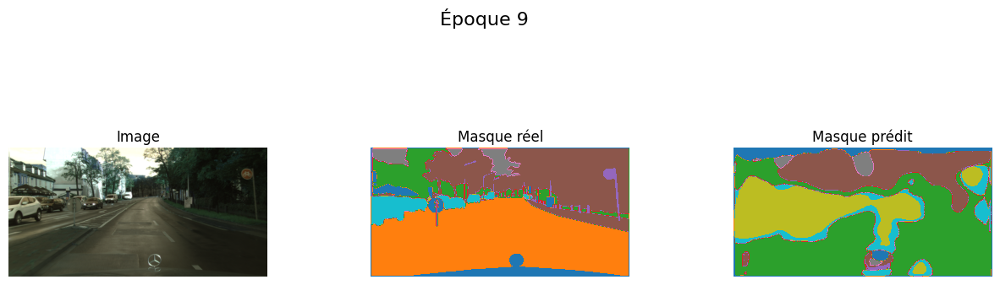

20/20 ━━━━━━━━━━━━━━━━━━━━ 1524s 78s/step - accuracy: 0.1763 - dice_coeff: 0.1747 - dice_loss: 0.8253 - jaccard_score: 0.0958 - loss: 0.0841 - total_loss: 0.8271 - val_accuracy: 0.2125 - val_dice_coeff: 0.1727 - val_dice_loss: 0.8273 - val_jaccard_score: 0.0946 - val_loss: 0.0830 - val_total_loss: 0.8096
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.2038 - dice_coeff: 0.1773 - dice_loss: 0.8227 - jaccard_score: 0.0973 - loss: 0.0850 - total_loss: 0.8111 
Epoch 10: val_jaccard_score improved from 0.09456 to 0.10106, saving model to best_model_tensorflow_1.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 710s 710s/step


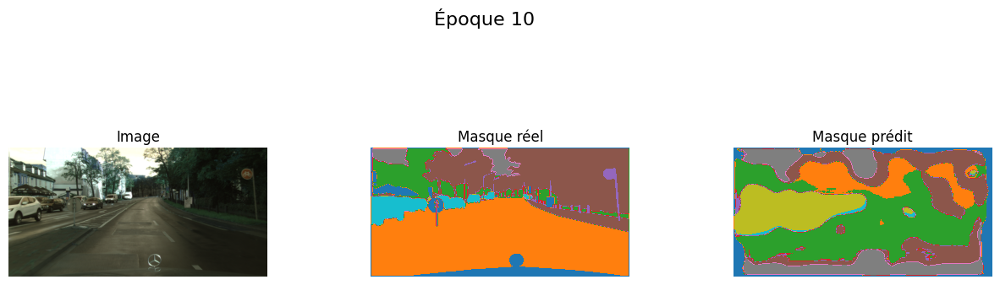

20/20 ━━━━━━━━━━━━━━━━━━━━ 1741s 88s/step - accuracy: 0.2034 - dice_coeff: 0.1773 - dice_loss: 0.8227 - jaccard_score: 0.0973 - loss: 0.0848 - total_loss: 0.8114 - val_accuracy: 0.2514 - val_dice_coeff: 0.1835 - val_dice_loss: 0.8165 - val_jaccard_score: 0.1011 - val_loss: 0.0798 - val_total_loss: 0.8241
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.2105 - dice_coeff: 0.1861 - dice_loss: 0.8139 - jaccard_score: 0.1026 - loss: 0.0796 - total_loss: 0.8294 
Epoch 11: val_jaccard_score did not improve from 0.10106
1/1 ━━━━━━━━━━━━━━━━━━━━ 639s 639s/step


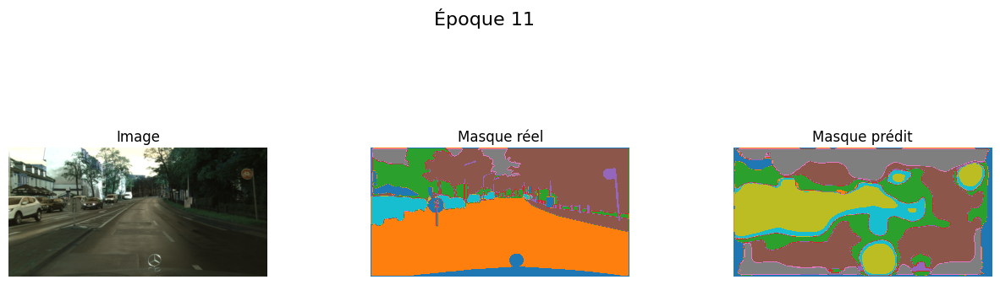

20/20 ━━━━━━━━━━━━━━━━━━━━ 1632s 83s/step - accuracy: 0.2103 - dice_coeff: 0.1861 - dice_loss: 0.8139 - jaccard_score: 0.1026 - loss: 0.0797 - total_loss: 0.8295 - val_accuracy: 0.1443 - val_dice_coeff: 0.1657 - val_dice_loss: 0.8343 - val_jaccard_score: 0.0904 - val_loss: 0.0807 - val_total_loss: 0.8283
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1730 - dice_coeff: 0.1770 - dice_loss: 0.8230 - jaccard_score: 0.0971 - loss: 0.0857 - total_loss: 0.8209 
Epoch 12: val_jaccard_score did not improve from 0.10106
1/1 ━━━━━━━━━━━━━━━━━━━━ 656s 656s/step


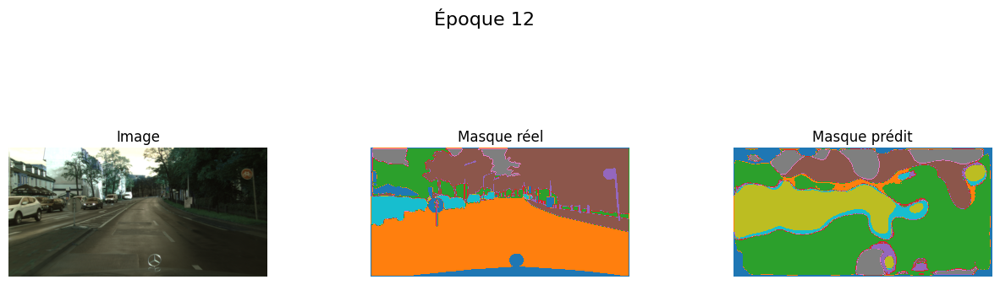

20/20 ━━━━━━━━━━━━━━━━━━━━ 1540s 79s/step - accuracy: 0.1742 - dice_coeff: 0.1773 - dice_loss: 0.8227 - jaccard_score: 0.0973 - loss: 0.0854 - total_loss: 0.8207 - val_accuracy: 0.1836 - val_dice_coeff: 0.1797 - val_dice_loss: 0.8203 - val_jaccard_score: 0.0988 - val_loss: 0.0826 - val_total_loss: 0.8473
Epoch 13/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.2470 - dice_coeff: 0.2091 - dice_loss: 0.7909 - jaccard_score: 0.1169 - loss: 0.0755 - total_loss: 0.8357 
Epoch 13: val_jaccard_score did not improve from 0.10106
1/1 ━━━━━━━━━━━━━━━━━━━━ 662s 662s/step


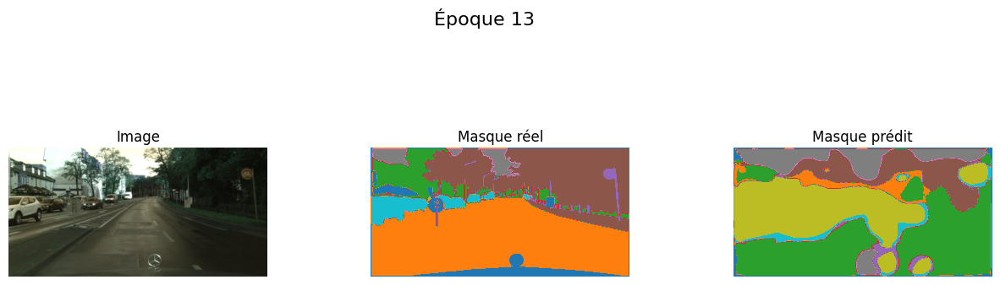

20/20 ━━━━━━━━━━━━━━━━━━━━ 1559s 80s/step - accuracy: 0.2470 - dice_coeff: 0.2088 - dice_loss: 0.7912 - jaccard_score: 0.1167 - loss: 0.0756 - total_loss: 0.8357 - val_accuracy: 0.1729 - val_dice_coeff: 0.1676 - val_dice_loss: 0.8324 - val_jaccard_score: 0.0915 - val_loss: 0.0830 - val_total_loss: 0.8417
Epoch 14/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.2445 - dice_coeff: 0.1987 - dice_loss: 0.8013 - jaccard_score: 0.1104 - loss: 0.0755 - total_loss: 0.8254 
Epoch 14: val_jaccard_score did not improve from 0.10106
1/1 ━━━━━━━━━━━━━━━━━━━━ 636s 636s/step


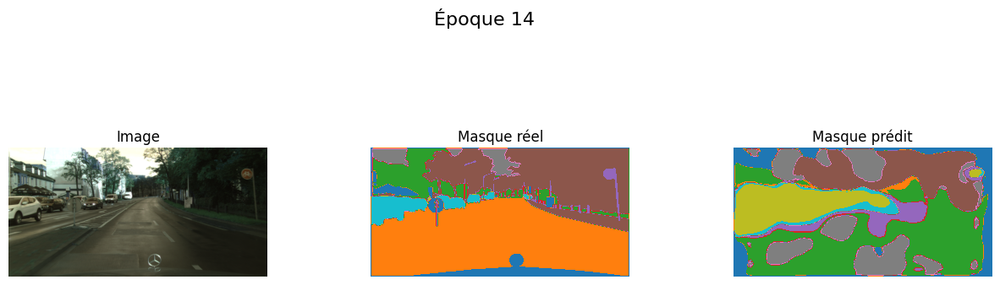

20/20 ━━━━━━━━━━━━━━━━━━━━ 1486s 76s/step - accuracy: 0.2453 - dice_coeff: 0.1989 - dice_loss: 0.8011 - jaccard_score: 0.1105 - loss: 0.0755 - total_loss: 0.8251 - val_accuracy: 0.1831 - val_dice_coeff: 0.1785 - val_dice_loss: 0.8215 - val_jaccard_score: 0.0981 - val_loss: 0.0806 - val_total_loss: 0.8337
Epoch 14: early stopping
Restoring model weights from the end of the best epoch: 10.


In [225]:
# Entraînement du modèle avec les données augmentées
history = model_tf_simple.fit(
    images_aug,
    masks_aug,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(model_tf_simple)]
)

#### Data augmentation étendue

In [226]:
# Définition des callbacks
early_stopping = EarlyStopping(
    monitor='val_jaccard_score',  
    patience=4,
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [227]:
filename = f"best_model_tensorflow_2.keras"

# Définition du callback ModelCheckpoint 
model_checkpoint = ModelCheckpoint(
    filepath=filename,
    monitor='val_jaccard_score',
    mode='max',
    save_best_only=True,
    verbose=1
)

In [228]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

In [ ]:
class_counts = Counter()
total_pixels = 0

for mask in masks:  # Parcours des masques d'entraînement
    unique, counts = np.unique(np.argmax(mask, axis=-1), return_counts=True)
    class_counts.update(dict(zip(unique, counts)))
    total_pixels += np.prod(mask.shape[:2])

# Calcul des poids inverses des fréquences
class_weights = {cls: 1.0 / freq for cls, freq in class_counts.items()}
total_weight = sum(class_weights.values())
class_weights = {cls: weight / total_weight for cls, weight in class_weights.items()}

# Convertir les poids en un vecteur utilisable
weights_vector = np.zeros(len(cats))
for cls, weight in class_weights.items():
    weights_vector[cls] = weight

print("Poids des classes :")
for cls, weight in enumerate(weights_vector):
    print(f"Classe {cls}: {weight:.4f}")

# Appliquer les poids calculés
loss_with_weights = weighted_categorical_crossentropy(weights_vector)

In [229]:
# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(512, 1024, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
x = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model_tf_etendu = Model(inputs=base_model.input, outputs=x)

# Compilation du modèle
model_tf_etendu.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
    loss=loss_with_weights, 
    metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy']
)

In [230]:
images_aug, masks_aug = augment_data_tf_extended(images, masks)

print("Shape des images :", images_aug.shape)  # (N, 512, 1024, 3)
print("Shape des masques :", masks_aug.shape)  # (N, 512, 1024, nombre_de_classes)

Shape des images : (100, 512, 1024, 3)
Shape des masques : (100, 512, 1024, 8)


Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1807 - dice_coeff: 0.1325 - dice_loss: 0.8675 - jaccard_score: 0.0709 - loss: 0.0946 - total_loss: 0.7757 
Epoch 1: val_jaccard_score improved from -inf to 0.06718, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 654s 654s/step


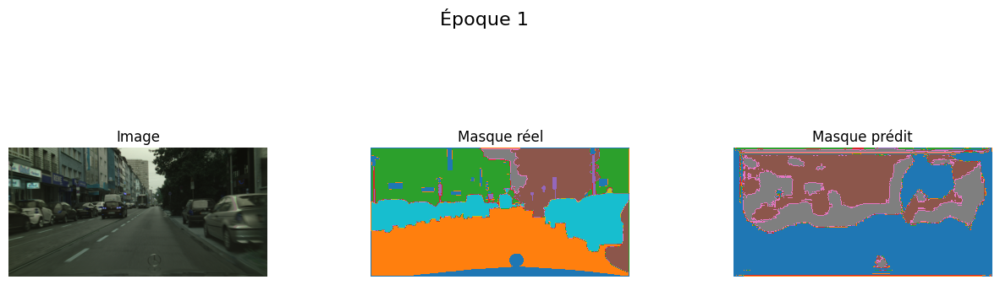

20/20 ━━━━━━━━━━━━━━━━━━━━ 1574s 79s/step - accuracy: 0.1789 - dice_coeff: 0.1324 - dice_loss: 0.8676 - jaccard_score: 0.0709 - loss: 0.0947 - total_loss: 0.7758 - val_accuracy: 0.1037 - val_dice_coeff: 0.1259 - val_dice_loss: 0.8741 - val_jaccard_score: 0.0672 - val_loss: 0.0895 - val_total_loss: 0.7831
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1364 - dice_coeff: 0.1255 - dice_loss: 0.8745 - jaccard_score: 0.0670 - loss: 0.0902 - total_loss: 0.7826 
Epoch 2: val_jaccard_score improved from 0.06718 to 0.07025, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 630s 630s/step


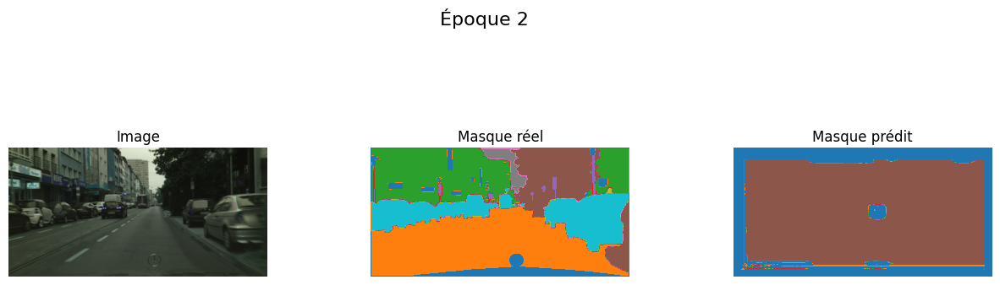

20/20 ━━━━━━━━━━━━━━━━━━━━ 1488s 76s/step - accuracy: 0.1369 - dice_coeff: 0.1255 - dice_loss: 0.8745 - jaccard_score: 0.0670 - loss: 0.0905 - total_loss: 0.7825 - val_accuracy: 0.1772 - val_dice_coeff: 0.1313 - val_dice_loss: 0.8687 - val_jaccard_score: 0.0702 - val_loss: 0.0880 - val_total_loss: 0.7781
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1701 - dice_coeff: 0.1305 - dice_loss: 0.8695 - jaccard_score: 0.0698 - loss: 0.0952 - total_loss: 0.7787 
Epoch 3: val_jaccard_score improved from 0.07025 to 0.07127, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 641s 641s/step


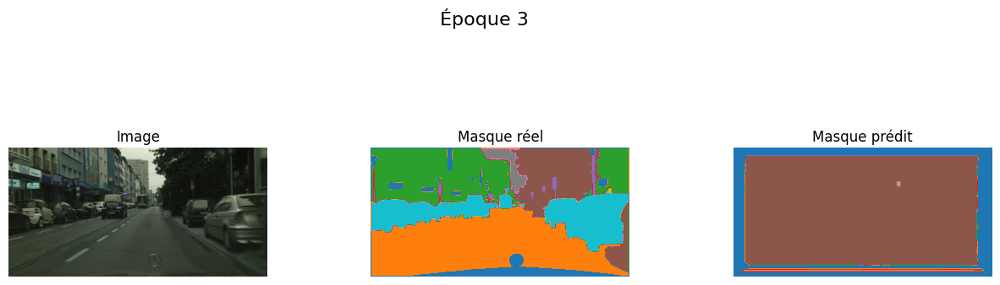

20/20 ━━━━━━━━━━━━━━━━━━━━ 1530s 79s/step - accuracy: 0.1702 - dice_coeff: 0.1306 - dice_loss: 0.8694 - jaccard_score: 0.0699 - loss: 0.0952 - total_loss: 0.7787 - val_accuracy: 0.1779 - val_dice_coeff: 0.1331 - val_dice_loss: 0.8669 - val_jaccard_score: 0.0713 - val_loss: 0.0877 - val_total_loss: 0.7774
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1677 - dice_coeff: 0.1367 - dice_loss: 0.8633 - jaccard_score: 0.0734 - loss: 0.0968 - total_loss: 0.7748 
Epoch 4: val_jaccard_score improved from 0.07127 to 0.07222, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 633s 633s/step


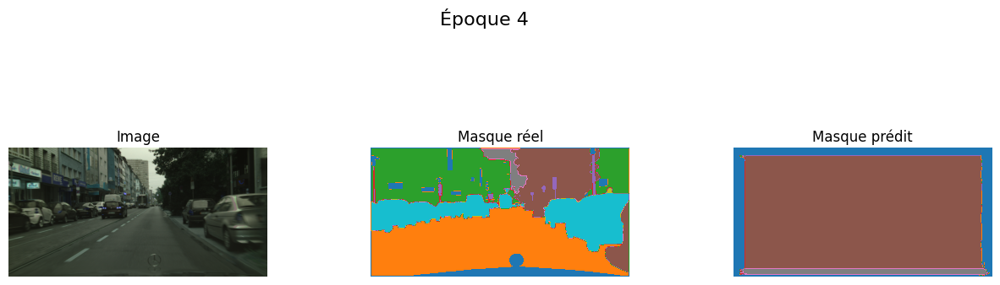

20/20 ━━━━━━━━━━━━━━━━━━━━ 1509s 77s/step - accuracy: 0.1679 - dice_coeff: 0.1368 - dice_loss: 0.8632 - jaccard_score: 0.0734 - loss: 0.0966 - total_loss: 0.7747 - val_accuracy: 0.1656 - val_dice_coeff: 0.1347 - val_dice_loss: 0.8653 - val_jaccard_score: 0.0722 - val_loss: 0.0874 - val_total_loss: 0.7751
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1949 - dice_coeff: 0.1376 - dice_loss: 0.8624 - jaccard_score: 0.0739 - loss: 0.0946 - total_loss: 0.7725 
Epoch 5: val_jaccard_score improved from 0.07222 to 0.07651, saving model to best_model_tensorflow_2.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 647s 647s/step


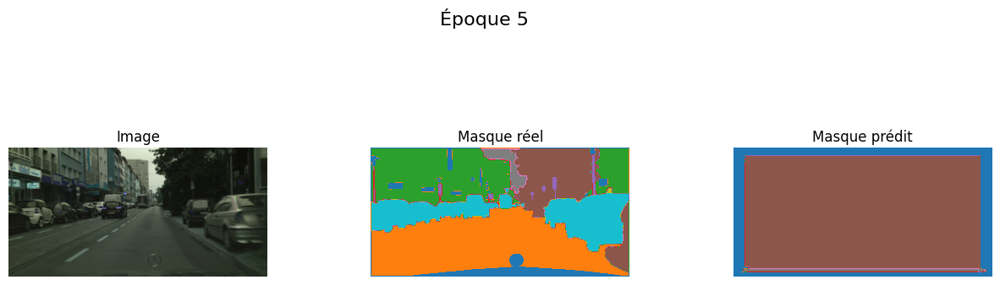

20/20 ━━━━━━━━━━━━━━━━━━━━ 1528s 78s/step - accuracy: 0.1941 - dice_coeff: 0.1377 - dice_loss: 0.8623 - jaccard_score: 0.0739 - loss: 0.0946 - total_loss: 0.7725 - val_accuracy: 0.1750 - val_dice_coeff: 0.1421 - val_dice_loss: 0.8579 - val_jaccard_score: 0.0765 - val_loss: 0.0868 - val_total_loss: 0.7685
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1921 - dice_coeff: 0.1418 - dice_loss: 0.8582 - jaccard_score: 0.0763 - loss: 0.0946 - total_loss: 0.7687 
Epoch 6: val_jaccard_score did not improve from 0.07651
1/1 ━━━━━━━━━━━━━━━━━━━━ 634s 634s/step


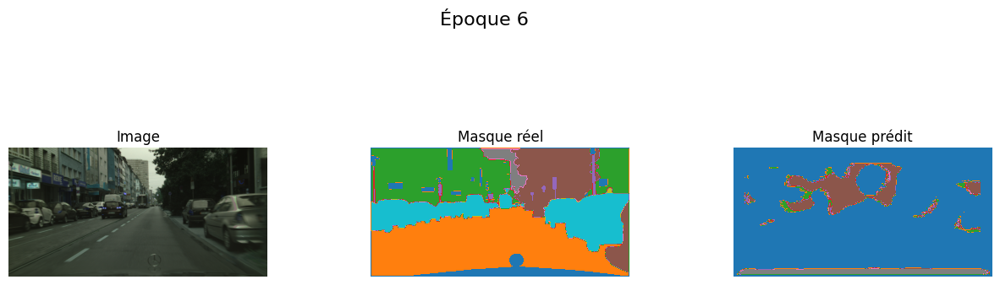

20/20 ━━━━━━━━━━━━━━━━━━━━ 1495s 76s/step - accuracy: 0.1910 - dice_coeff: 0.1417 - dice_loss: 0.8583 - jaccard_score: 0.0763 - loss: 0.0945 - total_loss: 0.7687 - val_accuracy: 0.0947 - val_dice_coeff: 0.1414 - val_dice_loss: 0.8586 - val_jaccard_score: 0.0761 - val_loss: 0.0872 - val_total_loss: 0.7700
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.1707 - dice_coeff: 0.1410 - dice_loss: 0.8590 - jaccard_score: 0.0758 - loss: 0.0942 - total_loss: 0.7705 
Epoch 7: val_jaccard_score did not improve from 0.07651
1/1 ━━━━━━━━━━━━━━━━━━━━ 657s 657s/step


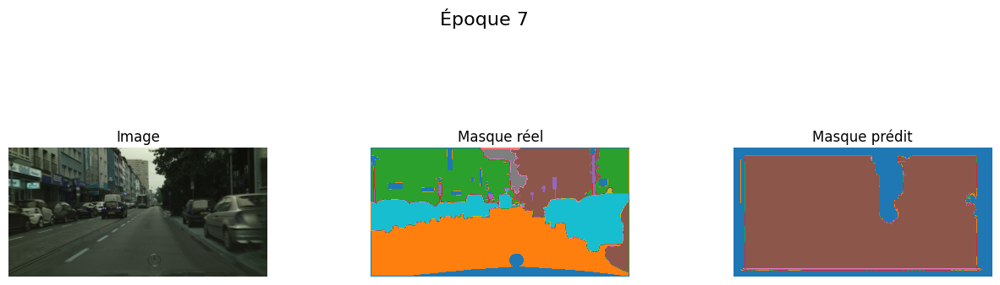

20/20 ━━━━━━━━━━━━━━━━━━━━ 1544s 79s/step - accuracy: 0.1711 - dice_coeff: 0.1409 - dice_loss: 0.8591 - jaccard_score: 0.0758 - loss: 0.0941 - total_loss: 0.7705 - val_accuracy: 0.1811 - val_dice_coeff: 0.1406 - val_dice_loss: 0.8594 - val_jaccard_score: 0.0756 - val_loss: 0.0868 - val_total_loss: 0.7702
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41s/step - accuracy: 0.1730 - dice_coeff: 0.1400 - dice_loss: 0.8600 - jaccard_score: 0.0752 - loss: 0.0926 - total_loss: 0.7705 
Epoch 8: val_jaccard_score did not improve from 0.07651
1/1 ━━━━━━━━━━━━━━━━━━━━ 624s 624s/step


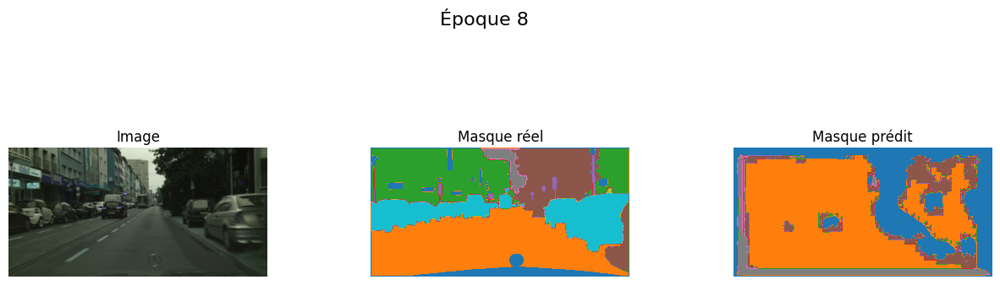

20/20 ━━━━━━━━━━━━━━━━━━━━ 1477s 75s/step - accuracy: 0.1744 - dice_coeff: 0.1400 - dice_loss: 0.8600 - jaccard_score: 0.0753 - loss: 0.0926 - total_loss: 0.7704 - val_accuracy: 0.2885 - val_dice_coeff: 0.1372 - val_dice_loss: 0.8628 - val_jaccard_score: 0.0736 - val_loss: 0.0869 - val_total_loss: 0.7713
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.2085 - dice_coeff: 0.1401 - dice_loss: 0.8599 - jaccard_score: 0.0753 - loss: 0.0905 - total_loss: 0.7681 
Epoch 9: val_jaccard_score did not improve from 0.07651
1/1 ━━━━━━━━━━━━━━━━━━━━ 640s 640s/step


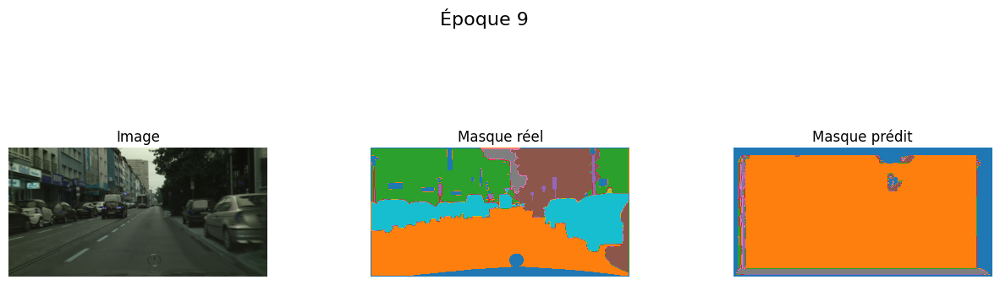

20/20 ━━━━━━━━━━━━━━━━━━━━ 1523s 78s/step - accuracy: 0.2099 - dice_coeff: 0.1401 - dice_loss: 0.8599 - jaccard_score: 0.0753 - loss: 0.0906 - total_loss: 0.7682 - val_accuracy: 0.3898 - val_dice_coeff: 0.1415 - val_dice_loss: 0.8585 - val_jaccard_score: 0.0761 - val_loss: 0.0869 - val_total_loss: 0.7685
Epoch 9: early stopping
Restoring model weights from the end of the best epoch: 5.


In [231]:
# Entraînement du modèle avec les données augmentées
history = model_tf_etendu.fit(
    images_aug,
    masks_aug,
    batch_size=4,
    epochs=20,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint, PredictionCallback(model_tf_etendu)]
)